<a href="https://colab.research.google.com/github/TimH2024/MSC-M5-Project/blob/main/3_Modelling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 3. Modelling

---

#### Load Libraries

In [ ]:
# Data Manipulation
import pandas as pd
import numpy as np

# Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Date and Time Utilities
from datetime import datetime

# Machine Learning - Model Selection and Preprocessing
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.preprocessing import StandardScaler

# Machine Learning - Regression Models
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
import xgboost as xgb

# Metrics for Evaluation
from sklearn.metrics import mean_squared_error, r2_score

# Deep Learning with Keras and TensorFlow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from scikeras.wrappers import KerasRegressor  # Wrapper for Keras models

# Statistical Analysis
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Hyperparameter Tuning
from scipy.stats import uniform, randint

# Suppress user warnings
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix
)
from tabulate import tabulate

from collections import Counter
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier, VotingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, ExtraTreesRegressor, GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler

sns.set(style='white', context='notebook', palette='deep')

from sklearn import metrics
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report, accuracy_score, f1_score
from collections import Counter

from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier, VotingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve
sns.set(style='white', context='notebook', palette='deep')
from sklearn.linear_model import SGDClassifier
from sklearn.neural_network import MLPClassifier
# Import required libraries
from sklearn.linear_model import LinearRegression  # Linear Regression
from sklearn.tree import DecisionTreeRegressor  # Decision Tree Regressor
from sklearn.svm import SVR  # Support Vector Regressor
from sklearn.neighbors import KNeighborsRegressor  # K-Nearest Neighbors Regressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, ExtraTreesRegressor, GradientBoostingRegressor  # Ensemble Regressors
from xgboost import XGBRegressor  # XGBoost Regressor
from sklearn.neural_network import MLPRegressor  # Multi-layer Perceptron Regressor

# Metrics for evaluation
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Visualization and utility
import matplotlib.pyplot as plt
import numpy as np
from tabulate import tabulate  # For summary table


In [ ]:
# Adjust settings to display all rows and columns
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns

# Read in the data sets
merged_dataset = pd.read_csv('feature-engineered-merged-dataset.csv')
merged_dataset.head()

,saleable_area(ft^2),unit_rate,floor,CG,CI,CPI,GDP,HS,IR,LTV,M3,MW,PG,PI,SD,SM,SOLD,UR,new_price,year,district_Central and Western District,district_HKIsIand Eastern District,district_HKIsIand Southern District,district_Kowloon Kowloon City District,district_Kowloon Kwun Tong District,district_Kowloon Sham Shui Po District,district_Kowloon Wong Tai Sin District,district_Kowloon Yau Tsim Mong District,district_Kwai Tsing District,district_New Territories East Long Ping Estate,district_New Territories East North District,district_New Territories East Sha Tin District,district_New Territories East Tai Po District,district_New Territories West Islands District,district_Tsuen Wan District,district_Tuen Mun District,district_Wan Chai District,district_Yuen Long District,region_HK,region_KLN,region_NTEast,region_NTWest,property_size_Large,property_size_Medium,property_size_Small,property_size_Very Large,YearQuarter_2020Q1,YearQuarter_2020Q2,YearQuarter_2020Q3,YearQuarter_2020Q4,YearQuarter_2021Q1,YearQuarter_2021Q2,YearQuarter_2021Q3,YearQuarter_2021Q4,YearQuarter_2022Q1,YearQuarter_2022Q2,YearQuarter_2022Q3,YearQuarter_2022Q4,YearQuarter_2023Q1
0,0.344456,0.496832,0.482759,1.0,0.952141,1.0,0.634361,0.0,1.0,0.5,1.0,1.0,0.756098,-10.24,0.0,0.249339,14509.0,0.0,6680016,2023,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0.407966,0.468545,0.137931,1.0,0.952141,1.0,0.634361,0.0,1.0,0.5,1.0,1.0,0.756098,-10.24,0.0,0.249339,14509.0,0.0,6800285,2023,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0.708288,0.499133,0.252874,1.0,0.952141,1.0,0.634361,0.0,1.0,0.5,1.0,1.0,0.756098,-10.24,0.0,0.249339,14509.0,0.0,12067177,2023,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,0.233584,0.423372,0.252874,1.0,0.952141,1.0,0.634361,0.0,1.0,0.5,1.0,1.0,0.756098,-10.24,0.0,0.249339,14509.0,0.0,4389440,2023,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0.447793,0.523348,0.643678,1.0,0.952141,1.0,0.634361,0.0,1.0,0.5,1.0,1.0,0.756098,-10.24,0.0,0.249339,14509.0,0.0,8584779,2023,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


# Training starts from here
### Defining the feature matrix (X) and target variables (y) from the merged dataset.

In [ ]:
# Define the feature matrix (X) and target variables (y)

features = merged_dataset.drop(columns=['new_price', 'PI', 'unit_rate', 'year'])
targets_120 = merged_dataset[['new_price', 'PI']]

X = features.copy()
y = targets_120.copy()

In [ ]:
features.head()

,saleable_area(ft^2),floor,CG,CI,CPI,GDP,HS,IR,LTV,M3,MW,PG,SD,SM,SOLD,UR,district_Central and Western District,district_HKIsIand Eastern District,district_HKIsIand Southern District,district_Kowloon Kowloon City District,district_Kowloon Kwun Tong District,district_Kowloon Sham Shui Po District,district_Kowloon Wong Tai Sin District,district_Kowloon Yau Tsim Mong District,district_Kwai Tsing District,district_New Territories East Long Ping Estate,district_New Territories East North District,district_New Territories East Sha Tin District,district_New Territories East Tai Po District,district_New Territories West Islands District,district_Tsuen Wan District,district_Tuen Mun District,district_Wan Chai District,district_Yuen Long District,region_HK,region_KLN,region_NTEast,region_NTWest,property_size_Large,property_size_Medium,property_size_Small,property_size_Very Large,YearQuarter_2020Q1,YearQuarter_2020Q2,YearQuarter_2020Q3,YearQuarter_2020Q4,YearQuarter_2021Q1,YearQuarter_2021Q2,YearQuarter_2021Q3,YearQuarter_2021Q4,YearQuarter_2022Q1,YearQuarter_2022Q2,YearQuarter_2022Q3,YearQuarter_2022Q4,YearQuarter_2023Q1
0,0.344456,0.482759,1.0,0.952141,1.0,0.634361,0.0,1.0,0.5,1.0,1.0,0.756098,0.0,0.249339,14509.0,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0.407966,0.137931,1.0,0.952141,1.0,0.634361,0.0,1.0,0.5,1.0,1.0,0.756098,0.0,0.249339,14509.0,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0.708288,0.252874,1.0,0.952141,1.0,0.634361,0.0,1.0,0.5,1.0,1.0,0.756098,0.0,0.249339,14509.0,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,0.233584,0.252874,1.0,0.952141,1.0,0.634361,0.0,1.0,0.5,1.0,1.0,0.756098,0.0,0.249339,14509.0,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0.447793,0.643678,1.0,0.952141,1.0,0.634361,0.0,1.0,0.5,1.0,1.0,0.756098,0.0,0.249339,14509.0,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


## Benchmarking Models

In [ ]:
merged_dataset.head()

,saleable_area(ft^2),unit_rate,floor,CG,CI,CPI,GDP,HS,IR,LTV,M3,MW,PG,PI,SD,SM,SOLD,UR,new_price,year,district_Central and Western District,district_HKIsIand Eastern District,district_HKIsIand Southern District,district_Kowloon Kowloon City District,district_Kowloon Kwun Tong District,district_Kowloon Sham Shui Po District,district_Kowloon Wong Tai Sin District,district_Kowloon Yau Tsim Mong District,district_Kwai Tsing District,district_New Territories East Long Ping Estate,district_New Territories East North District,district_New Territories East Sha Tin District,district_New Territories East Tai Po District,district_New Territories West Islands District,district_Tsuen Wan District,district_Tuen Mun District,district_Wan Chai District,district_Yuen Long District,region_HK,region_KLN,region_NTEast,region_NTWest,property_size_Large,property_size_Medium,property_size_Small,property_size_Very Large,YearQuarter_2020Q1,YearQuarter_2020Q2,YearQuarter_2020Q3,YearQuarter_2020Q4,YearQuarter_2021Q1,YearQuarter_2021Q2,YearQuarter_2021Q3,YearQuarter_2021Q4,YearQuarter_2022Q1,YearQuarter_2022Q2,YearQuarter_2022Q3,YearQuarter_2022Q4,YearQuarter_2023Q1
0,0.344456,0.496832,0.482759,1.0,0.952141,1.0,0.634361,0.0,1.0,0.5,1.0,1.0,0.756098,-10.24,0.0,0.249339,14509.0,0.0,6680016,2023,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0.407966,0.468545,0.137931,1.0,0.952141,1.0,0.634361,0.0,1.0,0.5,1.0,1.0,0.756098,-10.24,0.0,0.249339,14509.0,0.0,6800285,2023,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0.708288,0.499133,0.252874,1.0,0.952141,1.0,0.634361,0.0,1.0,0.5,1.0,1.0,0.756098,-10.24,0.0,0.249339,14509.0,0.0,12067177,2023,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,0.233584,0.423372,0.252874,1.0,0.952141,1.0,0.634361,0.0,1.0,0.5,1.0,1.0,0.756098,-10.24,0.0,0.249339,14509.0,0.0,4389440,2023,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0.447793,0.523348,0.643678,1.0,0.952141,1.0,0.634361,0.0,1.0,0.5,1.0,1.0,0.756098,-10.24,0.0,0.249339,14509.0,0.0,8584779,2023,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [ ]:
random_state = 123
# Scaling for target variable
scaler_y = MinMaxScaler()

In [ ]:
# Split into train and test sets

X_train, X_test, y_train, y_test = train_test_split(features, targets_120, test_size=0.3, random_state=42)

# Print the shapes of the datasets
print("Shapes of the datasets:")
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")


Shapes of the datasets:
X_train shape: (76876, 55)
X_test shape: (32948, 55)
y_train shape: (76876, 2)
y_test shape: (32948, 2)




Training regression models for target variable: new_price



MODEL: Linear Regression
Train R² Score: 0.386
Test R² Score: 0.394
Mean Absolute Error (MAE): 0.102
Mean Squared Error (MSE): 0.019
Root Mean Squared Error (RMSE): 0.137
Mean Absolute Percentage Error (MAPE): 31.360%


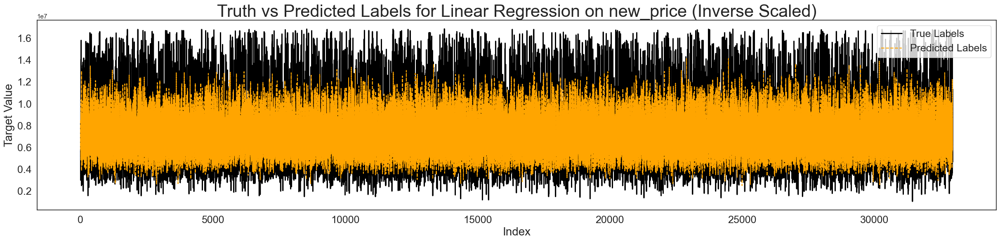

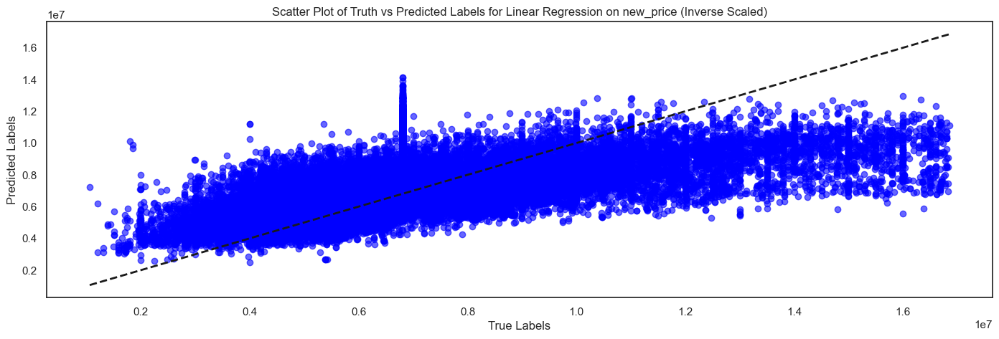


MODEL: Decision Tree Regressor
Train R² Score: 0.975
Test R² Score: 0.505
Mean Absolute Error (MAE): 0.067
Mean Squared Error (MSE): 0.015
Root Mean Squared Error (RMSE): 0.124
Mean Absolute Percentage Error (MAPE): 19.058%


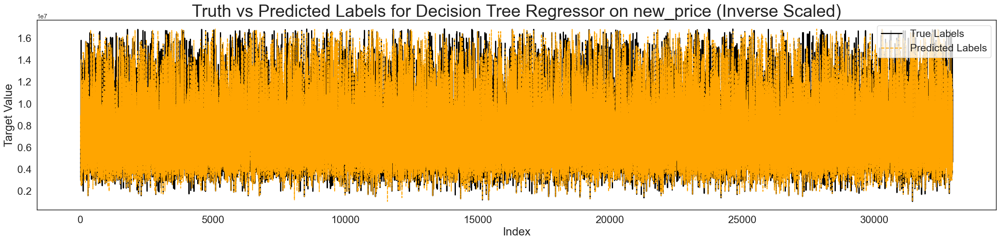

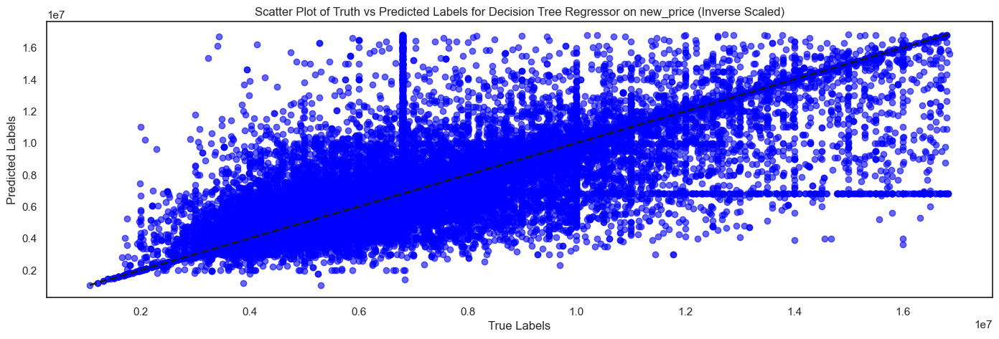


MODEL: Random Forest Regressor
Train R² Score: 0.940
Test R² Score: 0.690
Mean Absolute Error (MAE): 0.061
Mean Squared Error (MSE): 0.010
Root Mean Squared Error (RMSE): 0.098
Mean Absolute Percentage Error (MAPE): 17.853%


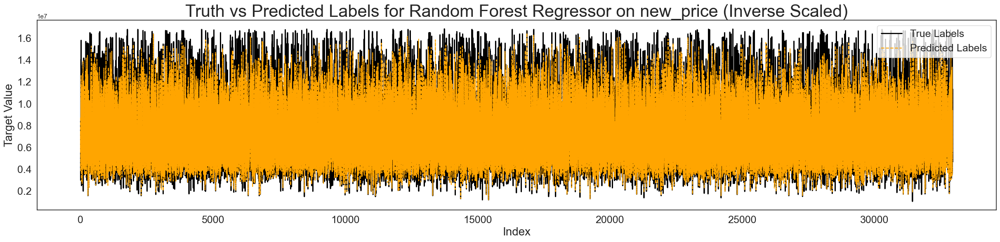

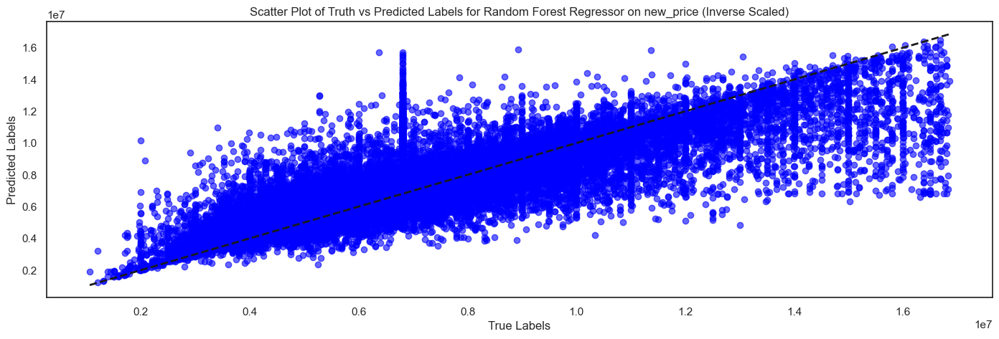


MODEL: AdaBoost Regressor
Train R² Score: 0.360
Test R² Score: 0.337
Mean Absolute Error (MAE): 0.112
Mean Squared Error (MSE): 0.021
Root Mean Squared Error (RMSE): 0.144
Mean Absolute Percentage Error (MAPE): 35.765%


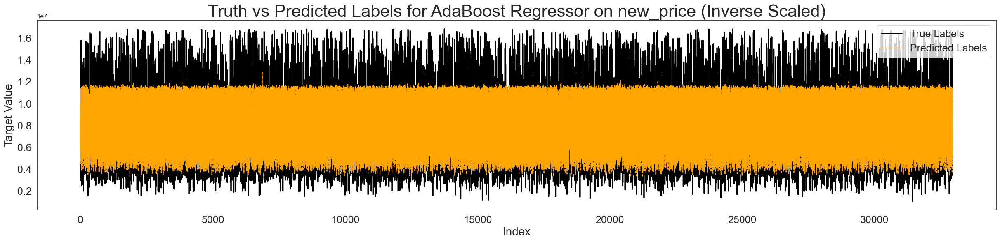

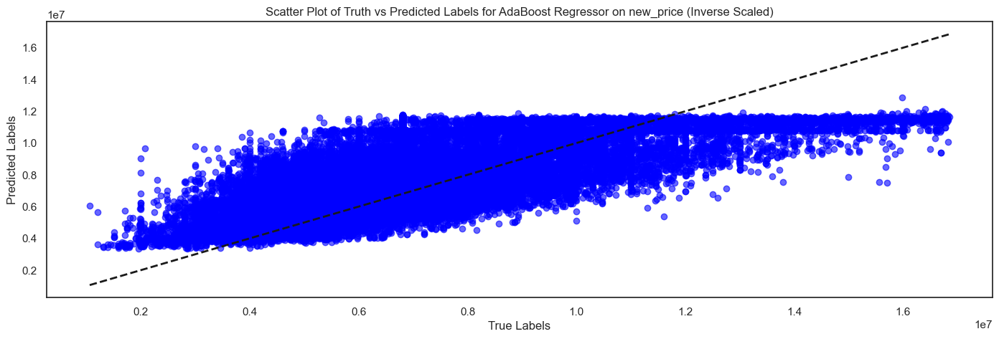


MODEL: Extra Trees Regressor
Train R² Score: 0.975
Test R² Score: 0.609
Mean Absolute Error (MAE): 0.069
Mean Squared Error (MSE): 0.012
Root Mean Squared Error (RMSE): 0.110
Mean Absolute Percentage Error (MAPE): 19.907%


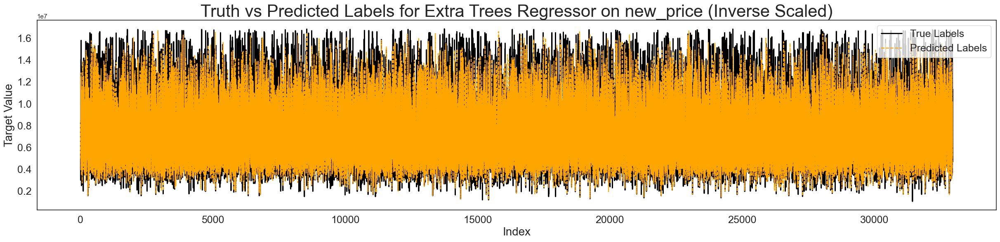

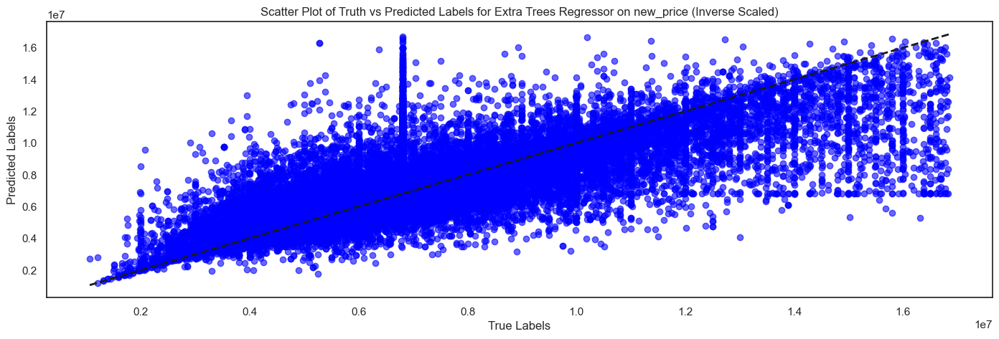


MODEL: Gradient Boosting Regressor
Train R² Score: 0.720
Test R² Score: 0.640
Mean Absolute Error (MAE): 0.074
Mean Squared Error (MSE): 0.011
Root Mean Squared Error (RMSE): 0.106
Mean Absolute Percentage Error (MAPE): 22.148%


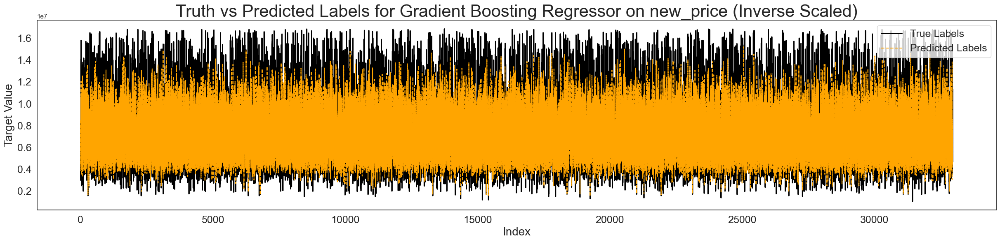

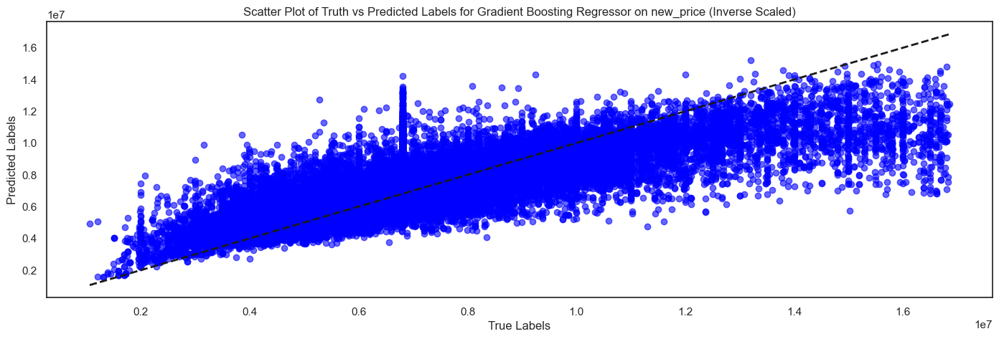


MODEL: XGBoost Regressor
Train R² Score: 0.712
Test R² Score: 0.640
Mean Absolute Error (MAE): 0.074
Mean Squared Error (MSE): 0.011
Root Mean Squared Error (RMSE): 0.106
Mean Absolute Percentage Error (MAPE): 22.309%


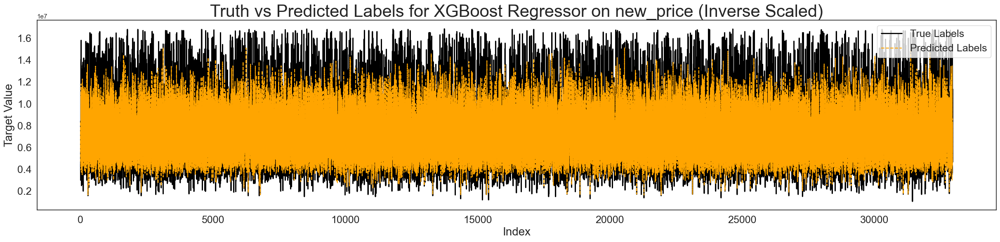

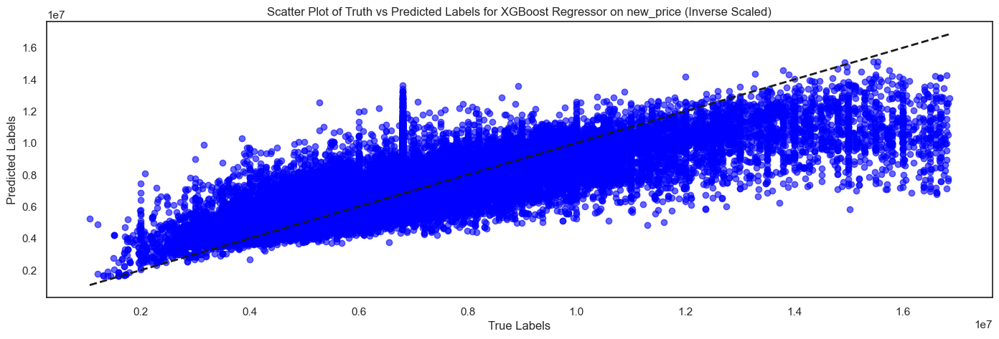


MODEL: MLP Regressor
Train R² Score: 0.294
Test R² Score: 0.301
Mean Absolute Error (MAE): 0.116
Mean Squared Error (MSE): 0.022
Root Mean Squared Error (RMSE): 0.148
Mean Absolute Percentage Error (MAPE): 39.609%


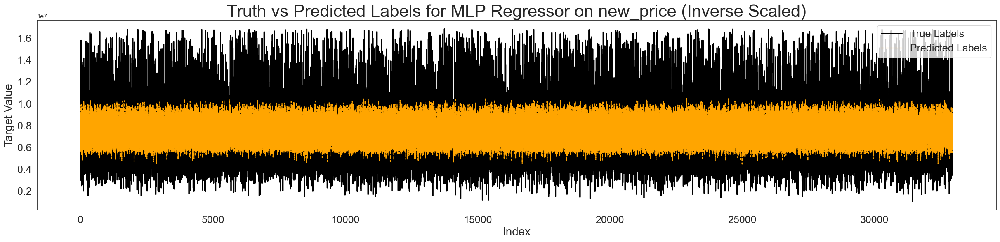

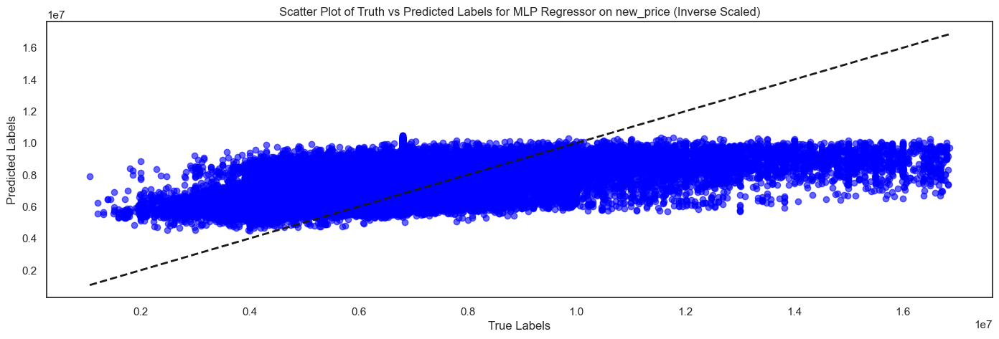



Training regression models for target variable: PI



MODEL: Linear Regression
Train R² Score: 1.000
Test R² Score: 1.000
Mean Absolute Error (MAE): 0.000
Mean Squared Error (MSE): 0.000
Root Mean Squared Error (RMSE): 0.000
Mean Absolute Percentage Error (MAPE): 0.000%


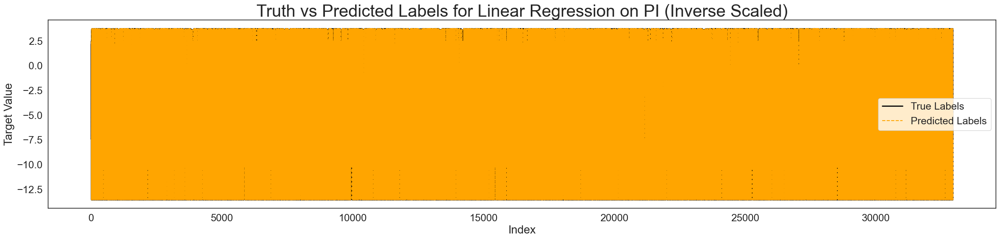

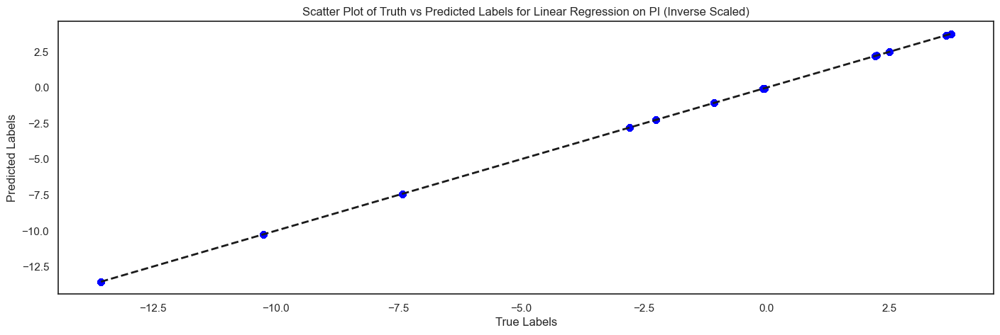


MODEL: Decision Tree Regressor
Train R² Score: 1.000
Test R² Score: 1.000
Mean Absolute Error (MAE): 0.000
Mean Squared Error (MSE): 0.000
Root Mean Squared Error (RMSE): 0.000
Mean Absolute Percentage Error (MAPE): 0.000%


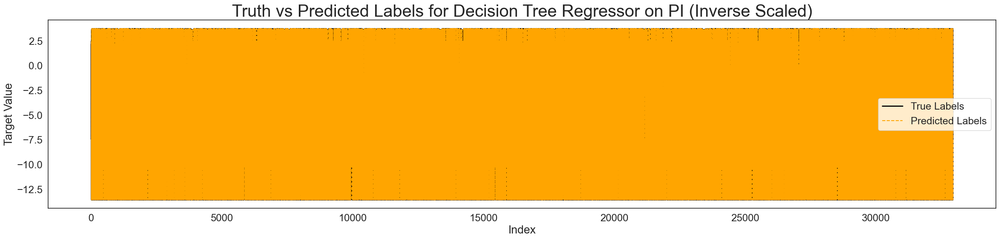

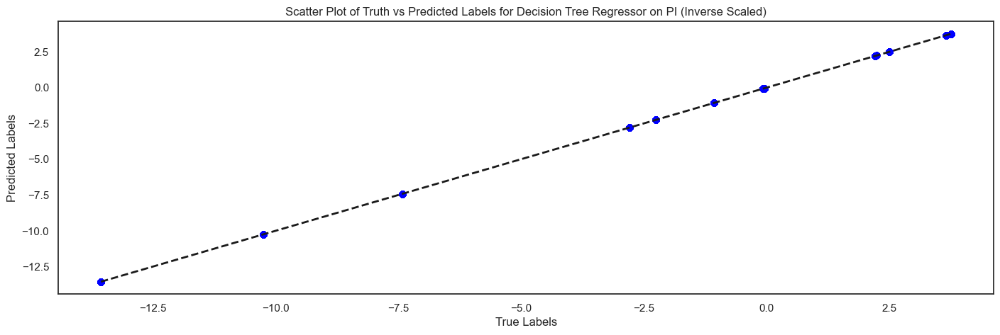


MODEL: Random Forest Regressor
Train R² Score: 1.000
Test R² Score: 1.000
Mean Absolute Error (MAE): 0.000
Mean Squared Error (MSE): 0.000
Root Mean Squared Error (RMSE): 0.000
Mean Absolute Percentage Error (MAPE): 0.000%


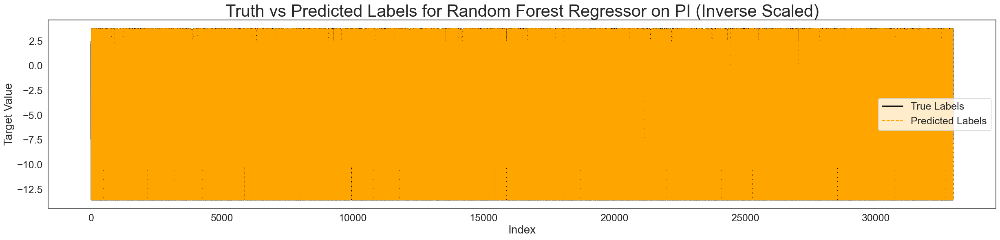

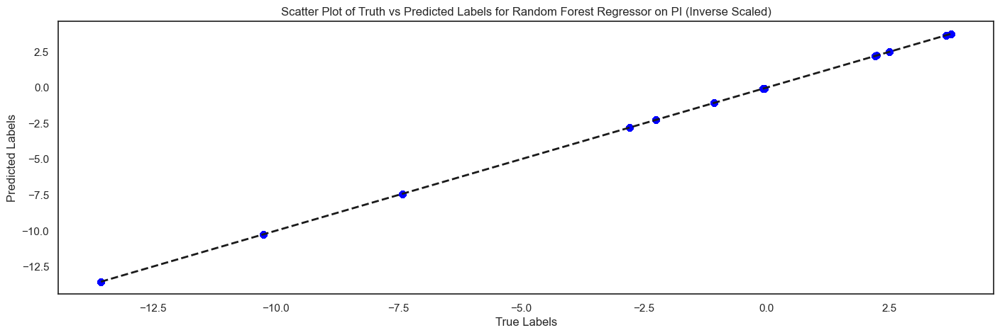


MODEL: AdaBoost Regressor
Train R² Score: 1.000
Test R² Score: 1.000
Mean Absolute Error (MAE): 0.000
Mean Squared Error (MSE): 0.000
Root Mean Squared Error (RMSE): 0.000
Mean Absolute Percentage Error (MAPE): 0.000%


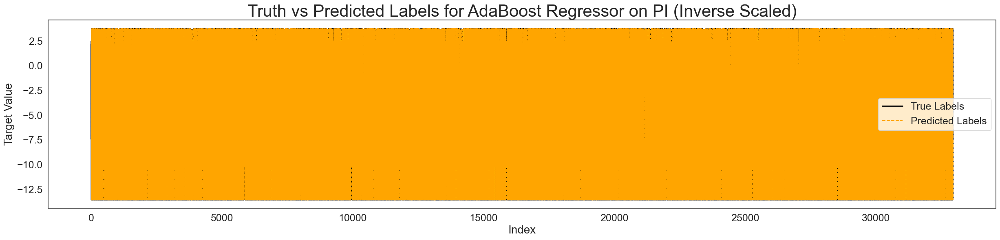

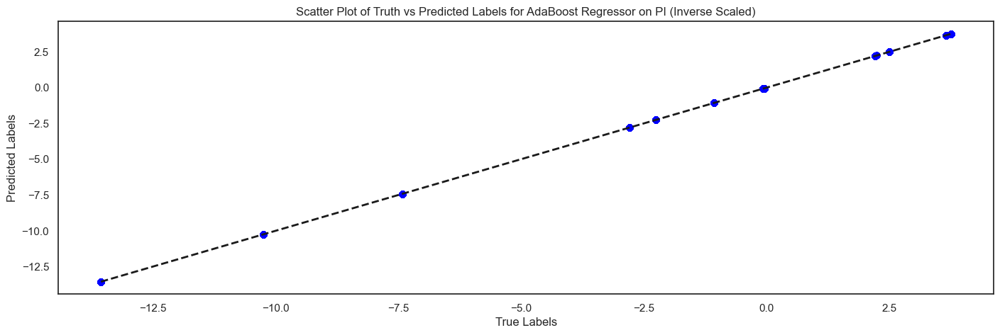


MODEL: Extra Trees Regressor
Train R² Score: 1.000
Test R² Score: 1.000
Mean Absolute Error (MAE): 0.000
Mean Squared Error (MSE): 0.000
Root Mean Squared Error (RMSE): 0.000
Mean Absolute Percentage Error (MAPE): 0.000%


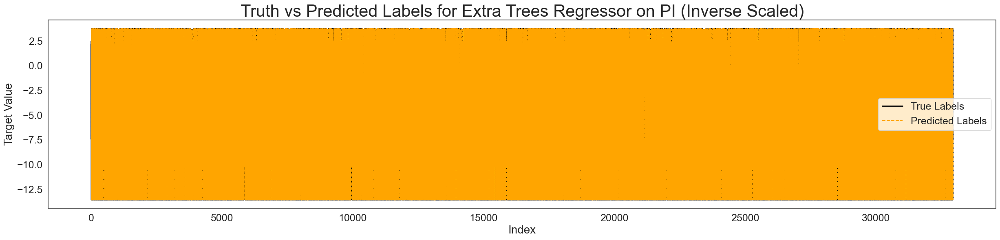

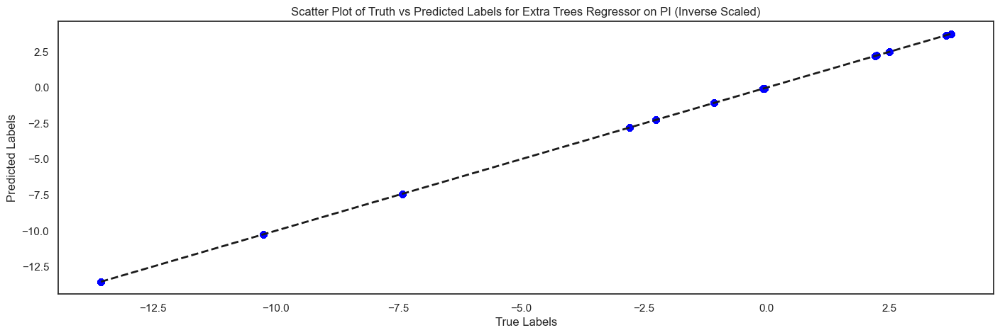


MODEL: Gradient Boosting Regressor
Train R² Score: 1.000
Test R² Score: 1.000
Mean Absolute Error (MAE): 0.002
Mean Squared Error (MSE): 0.000
Root Mean Squared Error (RMSE): 0.002
Mean Absolute Percentage Error (MAPE): 0.430%


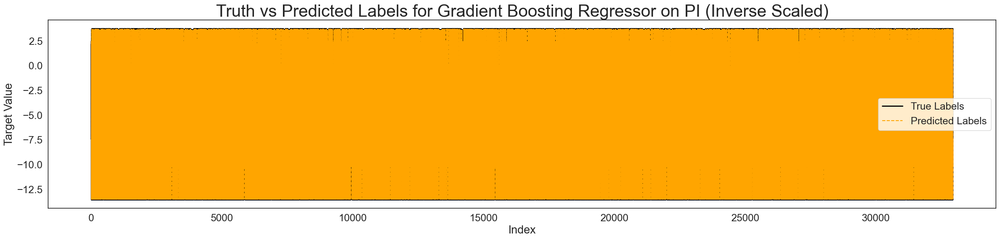

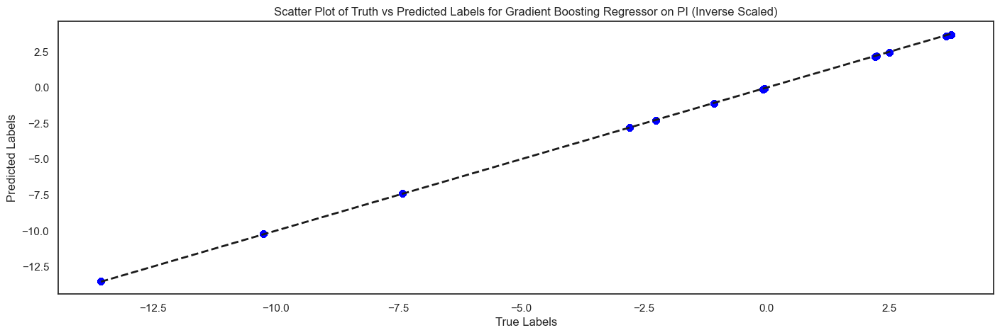


MODEL: XGBoost Regressor
Train R² Score: 1.000
Test R² Score: 1.000
Mean Absolute Error (MAE): 0.002
Mean Squared Error (MSE): 0.000
Root Mean Squared Error (RMSE): 0.002
Mean Absolute Percentage Error (MAPE): 0.452%


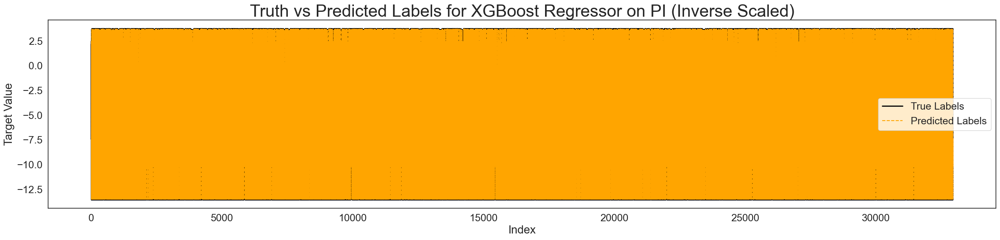

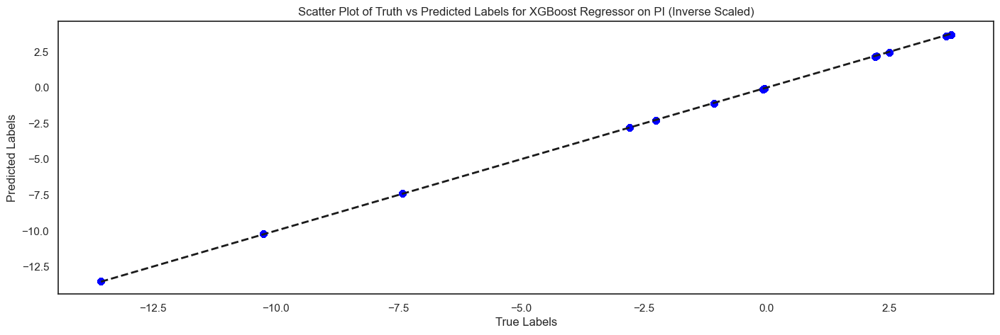


MODEL: MLP Regressor
Train R² Score: 0.990
Test R² Score: 0.990
Mean Absolute Error (MAE): 0.029
Mean Squared Error (MSE): 0.001
Root Mean Squared Error (RMSE): 0.036
Mean Absolute Percentage Error (MAPE): 7.506%


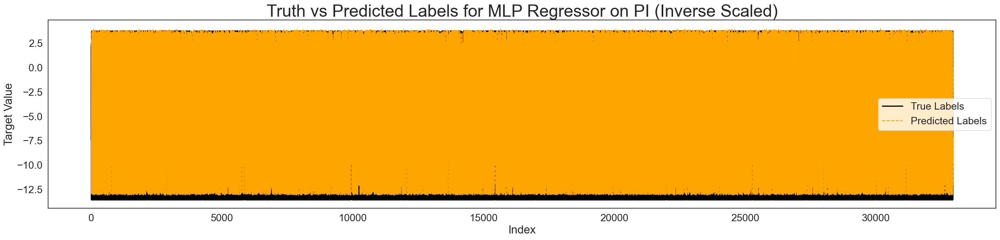

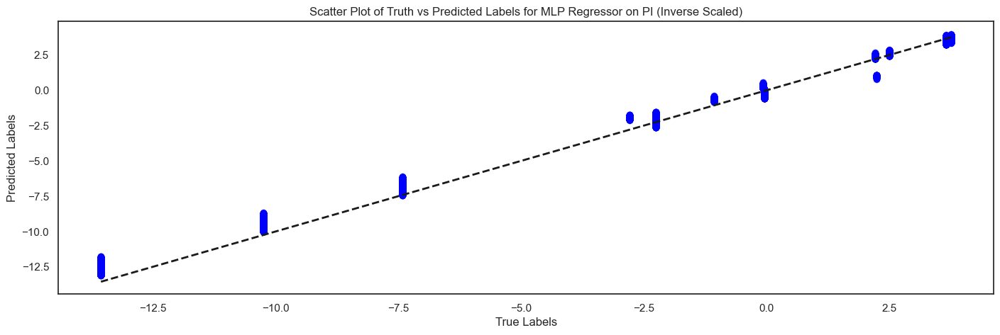

In [ ]:

# Models and Regressors
models = [
    "Linear Regression",
    "Decision Tree Regressor",
    "Random Forest Regressor",
    "AdaBoost Regressor",
    "Extra Trees Regressor",
    "Gradient Boosting Regressor",
    "XGBoost Regressor",
    "MLP Regressor"
]

regressors = [
    LinearRegression(),  # Linear Regression (simple linear model)
    DecisionTreeRegressor(random_state=42, max_depth=None, min_samples_split=2),  # Deeper tree
    RandomForestRegressor(random_state=42, n_estimators=300, max_depth=None),  # Random Forest Regressor
    AdaBoostRegressor(DecisionTreeRegressor(random_state=42, max_depth=10), n_estimators=200),  # AdaBoost with DT
    ExtraTreesRegressor(random_state=42, n_estimators=300, max_depth=None),  # Extra Trees Regressor
    GradientBoostingRegressor(random_state=42, learning_rate=0.01, n_estimators=500, max_depth=10),  # Gradient Boosting
    XGBRegressor(random_state=42, learning_rate=0.01, n_estimators=500, max_depth=10),  # XGBoost Regressor
    MLPRegressor(random_state=42, hidden_layer_sizes=(200, 100), learning_rate_init=0.01, max_iter=1000)  # MLP Regressor
]


# Initialize performance metrics for regression
train_r2 = []
test_r2 = []
mae = []
mse = []
rmse = []
mape = []


# Initialize empty dataframes for storing results
new_price_results = pd.DataFrame(columns=["Model", "Train R²", "Test R²", "MAE", "MSE", "RMSE", "MAPE"])
pi_results = pd.DataFrame(columns=["Model", "Train R²", "Test R²", "MAE", "MSE", "RMSE", "MAPE"])

# Assume targets_120, X_train, and X_test are pre-defined DataFrames
# Example: targets_120 = pd.DataFrame({'new_price': y_train_data, 'PI': y_train_pi})

# Iterate over each target variable
for target_idx, target_name in enumerate(targets_120.columns):
    print(f"\n{'='*125}\n{'='*125}")
    print(f'\nTraining regression models for target variable: {target_name}\n')
    print(f"\n{'='*125}\n{'='*125}")

    # Scale the specific target column
    y_train_target = scaler_y.fit_transform(y_train[[target_name]])  # Scale target column
    y_test_target = scaler_y.transform(y_test[[target_name]])       # Transform test target

    # Loop through regressors
    for regressor, model in zip(regressors, models):
        print(f"\n{'='*125}\nMODEL: {model}\n{'='*125}")

        # Fit and predict
        regressor.fit(X_train, y_train_target.ravel())  # Flatten target for fitting
        train_prediction = regressor.predict(X_train)
        test_prediction = regressor.predict(X_test)

        # Metrics on scaled predictions
        train_r2_score = r2_score(y_train_target, train_prediction)
        test_r2_score = r2_score(y_test_target, test_prediction)
        mae_val = mean_absolute_error(y_test_target, test_prediction)
        mse_val = mean_squared_error(y_test_target, test_prediction)
        rmse_val = np.sqrt(mse_val)

        # Ensure arrays are 1D
        y_test_target_flat = y_test_target.flatten()
        test_prediction_flat = test_prediction.flatten()

        # Avoid division by zero
        denominator = np.where(y_test_target_flat == 0, 1, y_test_target_flat)

        # Compute MAPE
        mape_val = np.mean(np.abs((y_test_target_flat - test_prediction_flat) / denominator)) * 100

        # Inverse scaling predictions
        test_prediction_rescaled = scaler_y.inverse_transform(test_prediction.reshape(-1, 1))  # Inverse scale test predictions
        y_test_rescaled = scaler_y.inverse_transform(y_test_target)  # Inverse scale true test values

        # Display metrics
        print(f"Train R² Score: {train_r2_score:.3f}")
        print(f"Test R² Score: {test_r2_score:.3f}")
        print(f"Mean Absolute Error (MAE): {mae_val:.3f}")
        print(f"Mean Squared Error (MSE): {mse_val:.3f}")
        print(f"Root Mean Squared Error (RMSE): {rmse_val:.3f}")
        print(f"Mean Absolute Percentage Error (MAPE): {mape_val:.3f}%")

        # Append results to appropriate DataFrame based on target_name
        result = [model, train_r2_score, test_r2_score, mae_val, mse_val, rmse_val, mape_val]

        if target_name == 'new_price':  # For new_price target
            new_price_results.loc[len(new_price_results)] = result
        elif target_name == 'PI':  # For PI target
            pi_results.loc[len(pi_results)] = result

        # Visualizations (Scatter plot, residual plot, etc.)

        # Line plot of truth vs predicted labels after inverse scaling
        plt.figure(figsize=(30, 6))
        plt.plot(range(len(y_test_rescaled)), y_test_rescaled, label='True Labels', color='black', linewidth=2)
        plt.plot(range(len(test_prediction_rescaled)), test_prediction_rescaled, label='Predicted Labels', color='orange', linestyle='--')
        plt.title(f'Truth vs Predicted Labels for {model} on {target_name} (Inverse Scaled)', fontsize=30)
        plt.xlabel('Index', fontsize=20)
        plt.ylabel('Target Value', fontsize=20)
        plt.xticks(fontsize=18)  # Increase font size for x-axis tick labels
        plt.yticks(fontsize=18)  # Increase font size for y-axis tick labels
        plt.legend(fontsize=18)  # Increase font size for the legend
        plt.show()

        # Scatter plot of truth vs predicted labels
        plt.figure(figsize=(17, 5))
        plt.scatter(y_test_rescaled, test_prediction_rescaled, alpha=0.6, color='blue')
        plt.plot([y_test_rescaled.min(), y_test_rescaled.max()], [y_test_rescaled.min(), y_test_rescaled.max()], 'k--', lw=2)
        plt.title(f'Scatter Plot of Truth vs Predicted Labels for {model} on {target_name} (Inverse Scaled)')
        plt.xlabel('True Labels')
        plt.ylabel('Predicted Labels')
        plt.show()


In [ ]:
# After loop completes, you can view or save the results
print("New Price Results")
display(new_price_results)

New Price Results


,Model,Train R²,Test R²,MAE,MSE,RMSE,MAPE
0,Linear Regression,0.385859,0.393754,0.102222,0.018876,0.137390,31.359832
1,Decision Tree Regressor,0.975035,0.504650,0.066951,0.015423,0.124190,19.058001
2,Random Forest Regressor,0.940059,0.689883,0.061365,0.009656,0.098264,17.853252
3,AdaBoost Regressor,0.359618,0.336881,0.112367,0.020647,0.143690,35.765465
4,Extra Trees Regressor,0.975035,0.609072,0.068588,0.012172,0.110326,19.907083
5,Gradient Boosting Regressor,0.720012,0.640139,0.074219,0.011205,0.105852,22.147861
6,XGBoost Regressor,0.711880,0.639576,0.074433,0.011222,0.105935,22.308731
7,MLP Regressor,0.293589,0.300880,0.115979,0.021768,0.147539,39.609249


In [ ]:
# Train R²: 0.4608
# Test R²: 0.4656
# MAE: 0.0961
# MSE: 0.0166
# RMSE: 0.1290
# MAPE: 29.39%

In [ ]:
print("PI Results")
display(pi_results)

PI Results


,Model,Train R²,Test R²,MAE,MSE,RMSE,MAPE
0,Linear Regression,1.000000,1.000000,5.614618e-14,1.089671e-26,1.043873e-13,1.303506e-11
1,Decision Tree Regressor,1.000000,1.000000,1.583964e-14,7.052210e-28,2.655600e-14,2.776741e-12
2,Random Forest Regressor,1.000000,1.000000,7.133364e-15,2.097745e-28,1.448359e-14,1.169383e-12
3,AdaBoost Regressor,1.000000,1.000000,2.255850e-14,1.265778e-27,3.557778e-14,6.576837e-12
4,Extra Trees Regressor,1.000000,1.000000,1.214017e-14,4.670923e-28,2.161232e-14,1.939982e-12
5,Gradient Boosting Regressor,0.999957,0.999957,2.159690e-03,5.565111e-06,2.359049e-03,4.295281e-01
6,XGBoost Regressor,0.999957,0.999956,2.180917e-03,5.614558e-06,2.369506e-03,4.515929e-01
7,MLP Regressor,0.990210,0.990108,2.853779e-02,1.274999e-03,3.570713e-02,7.506187e+00


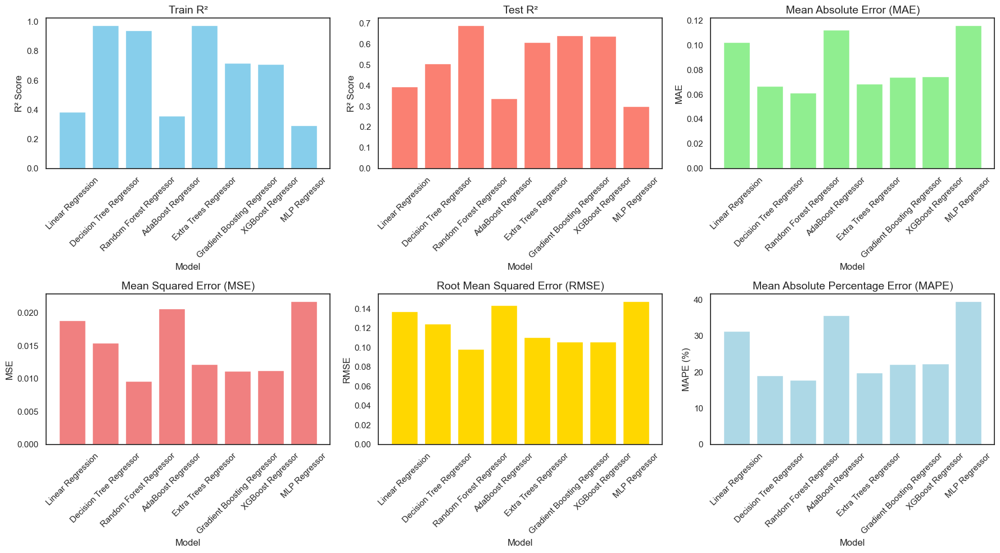

In [ ]:
# Plotting all metrics in separate subplots
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Plot Train R²
axes[0, 0].bar(new_price_results['Model'], new_price_results['Train R²'], color='skyblue')
axes[0, 0].set_title('Train R²', fontsize=14)
axes[0, 0].set_xlabel('Model', fontsize=12)
axes[0, 0].set_ylabel('R² Score', fontsize=12)
axes[0, 0].tick_params(axis='x', rotation=45)

# Plot Test R²
axes[0, 1].bar(new_price_results['Model'], new_price_results['Test R²'], color='salmon')
axes[0, 1].set_title('Test R²', fontsize=14)
axes[0, 1].set_xlabel('Model', fontsize=12)
axes[0, 1].set_ylabel('R² Score', fontsize=12)
axes[0, 1].tick_params(axis='x', rotation=45)

# Plot MAE
axes[0, 2].bar(new_price_results['Model'], new_price_results['MAE'], color='lightgreen')
axes[0, 2].set_title('Mean Absolute Error (MAE)', fontsize=14)
axes[0, 2].set_xlabel('Model', fontsize=12)
axes[0, 2].set_ylabel('MAE', fontsize=12)
axes[0, 2].tick_params(axis='x', rotation=45)

# Plot MSE
axes[1, 0].bar(new_price_results['Model'], new_price_results['MSE'], color='lightcoral')
axes[1, 0].set_title('Mean Squared Error (MSE)', fontsize=14)
axes[1, 0].set_xlabel('Model', fontsize=12)
axes[1, 0].set_ylabel('MSE', fontsize=12)
axes[1, 0].tick_params(axis='x', rotation=45)

# Plot RMSE
axes[1, 1].bar(new_price_results['Model'], new_price_results['RMSE'], color='gold')
axes[1, 1].set_title('Root Mean Squared Error (RMSE)', fontsize=14)
axes[1, 1].set_xlabel('Model', fontsize=12)
axes[1, 1].set_ylabel('RMSE', fontsize=12)
axes[1, 1].tick_params(axis='x', rotation=45)

# Plot MAPE
axes[1, 2].bar(new_price_results['Model'], new_price_results['MAPE'], color='lightblue')
axes[1, 2].set_title('Mean Absolute Percentage Error (MAPE)', fontsize=14)
axes[1, 2].set_xlabel('Model', fontsize=12)
axes[1, 2].set_ylabel('MAPE (%)', fontsize=12)
axes[1, 2].tick_params(axis='x', rotation=45)

# Adjust layout
plt.tight_layout()
plt.show()

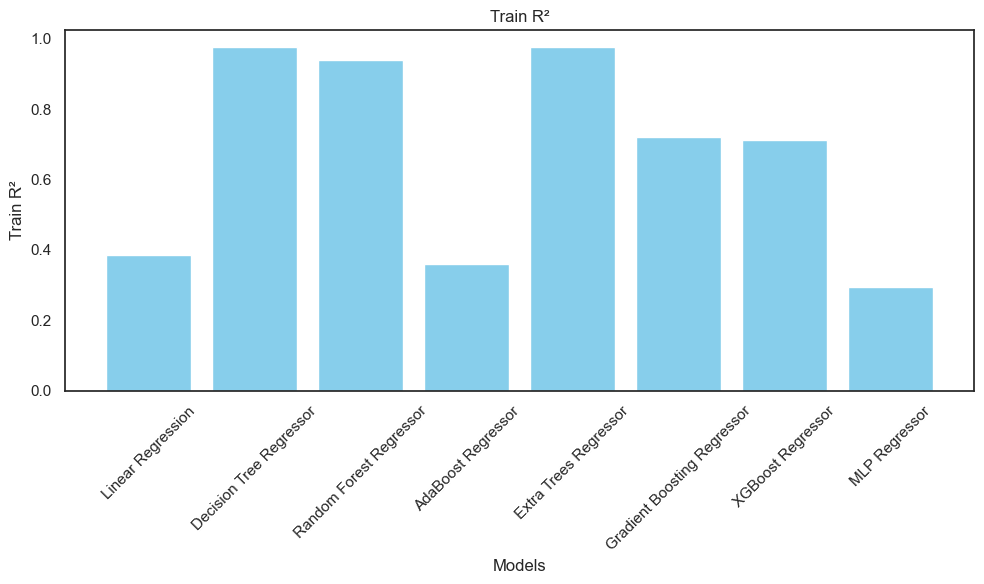

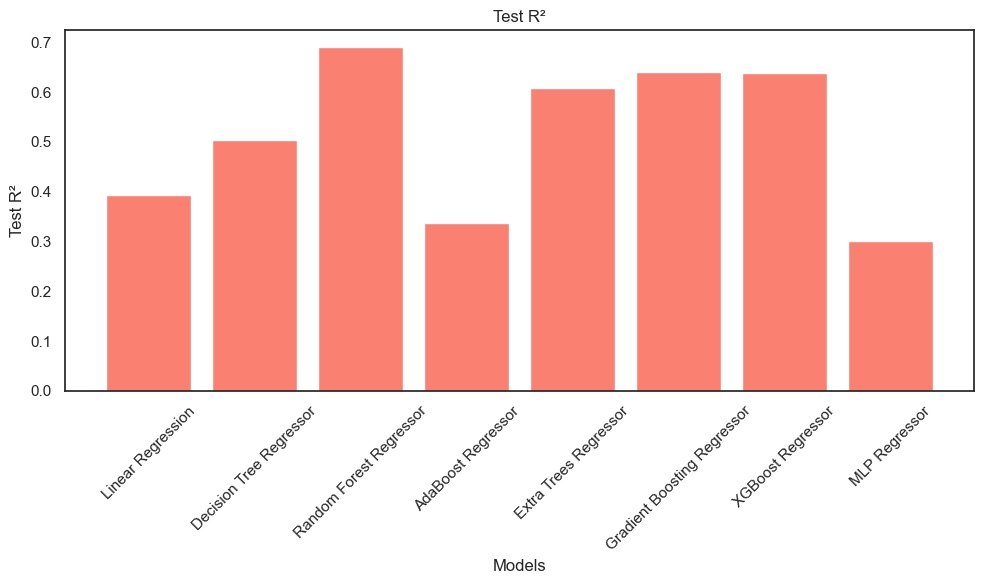

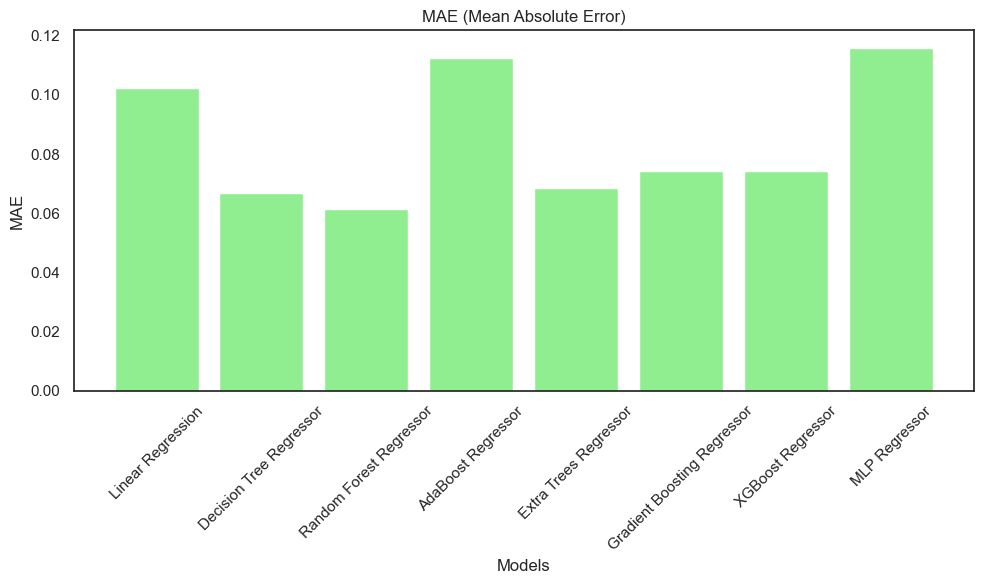

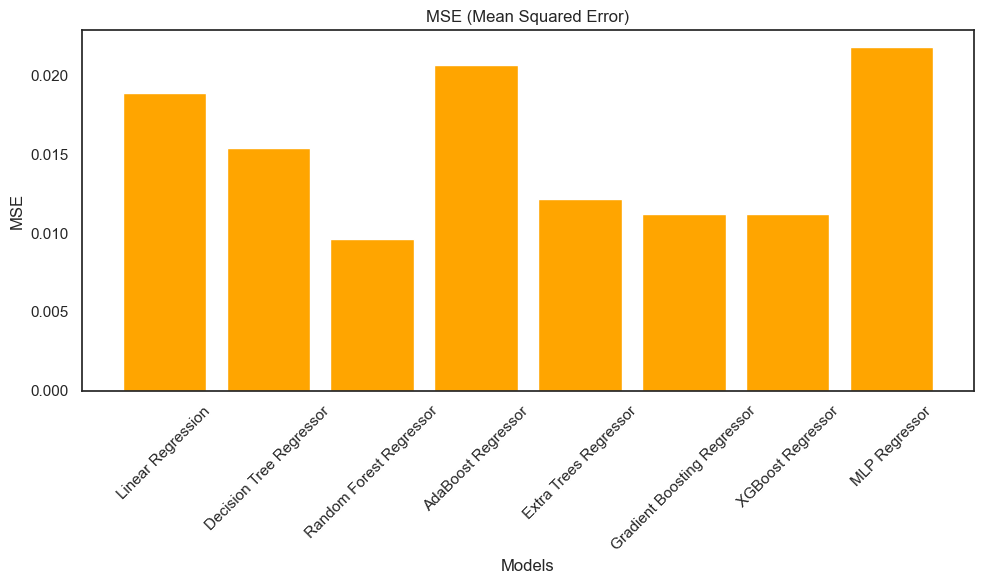

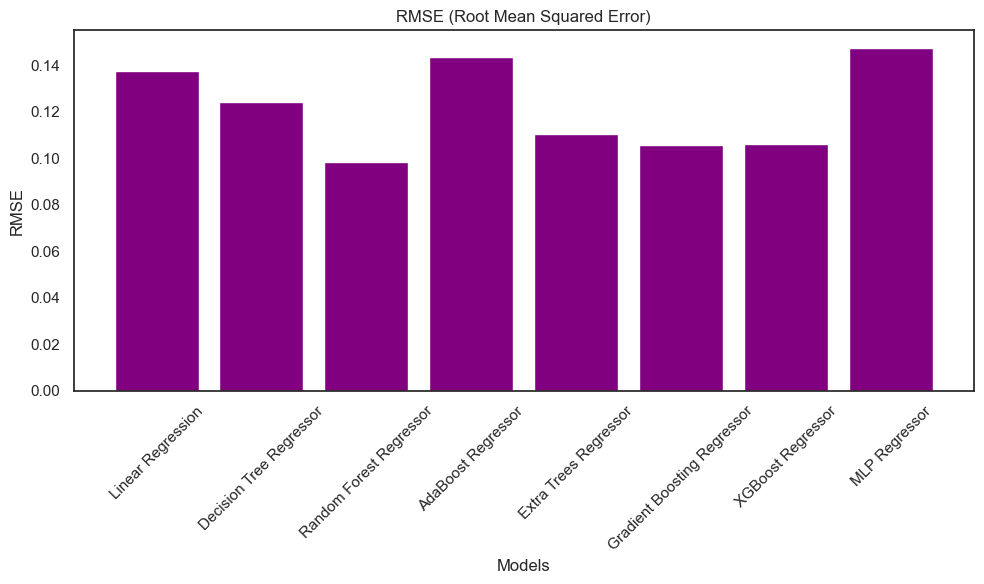

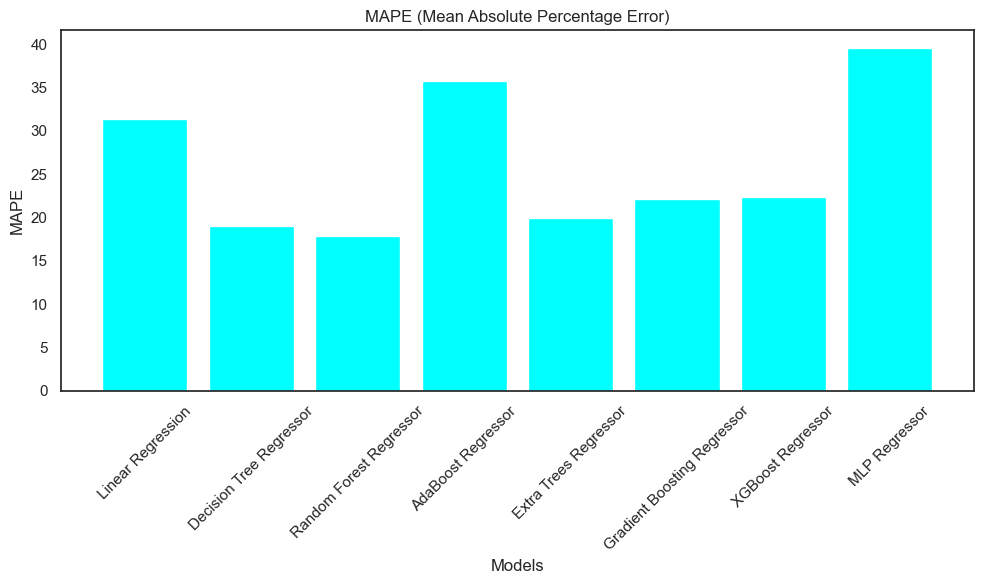

In [ ]:

# Plot Train R²
plt.figure(figsize=(10, 6))
plt.bar(pi_results['Model'], pi_results['Train R²'], color='skyblue')
plt.title('Train R²')
plt.xlabel('Models')
plt.ylabel('Train R²')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot Test R²
plt.figure(figsize=(10, 6))
plt.bar(pi_results['Model'], pi_results['Test R²'], color='salmon')
plt.title('Test R²')
plt.xlabel('Models')
plt.ylabel('Test R²')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot MAE
plt.figure(figsize=(10, 6))
plt.bar(pi_results['Model'], pi_results['MAE'], color='lightgreen')
plt.title('MAE (Mean Absolute Error)')
plt.xlabel('Models')
plt.ylabel('MAE')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot MSE
plt.figure(figsize=(10, 6))
plt.bar(pi_results['Model'], pi_results['MSE'], color='orange')
plt.title('MSE (Mean Squared Error)')
plt.xlabel('Models')
plt.ylabel('MSE')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot RMSE
plt.figure(figsize=(10, 6))
plt.bar(pi_results['Model'], pi_results['RMSE'], color='purple')
plt.title('RMSE (Root Mean Squared Error)')
plt.xlabel('Models')
plt.ylabel('RMSE')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot MAPE
plt.figure(figsize=(10, 6))
plt.bar(pi_results['Model'], pi_results['MAPE'], color='cyan')
plt.title('MAPE (Mean Absolute Percentage Error)')
plt.xlabel('Models')
plt.ylabel('MAPE')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


---

---

## Feature Importance

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Randomly sample 10,000 rows from the dataset
sampled_data = features.sample(n=10000, random_state=42)  # Set random_state for reproducibility
sampled_targets = targets_120.loc[sampled_data.index, 'new_price']

# Train the RandomForestClassifier on the sampled data
clf = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
clf.fit(sampled_data, sampled_targets)

# Calculate and display feature importances
importances = clf.feature_importances_
feature_importances = pd.DataFrame(importances,
                                   index=sampled_data.columns,
                                   columns=['importance']).sort_values('importance', ascending=False)

display(feature_importances)

,importance
saleable_area(ft^2),0.266361
floor,0.182362
property_size_Large,0.101088
property_size_Very Large,0.088765
property_size_Small,0.054129
property_size_Medium,0.051694
region_NTWest,0.016749
SM,0.012280
CI,0.011557
district_HKIsIand Southern District,0.010771


In [ ]:
feature_importances = feature_importances.reset_index()
feature_importances.columns = ['Feature', 'Importance']
feature_importances

,Feature,Importance
0,saleable_area(ft^2),0.266361
1,floor,0.182362
2,property_size_Large,0.101088
3,property_size_Very Large,0.088765
4,property_size_Small,0.054129
5,property_size_Medium,0.051694
6,region_NTWest,0.016749
7,SM,0.012280
8,CI,0.011557
9,district_HKIsIand Southern District,0.010771


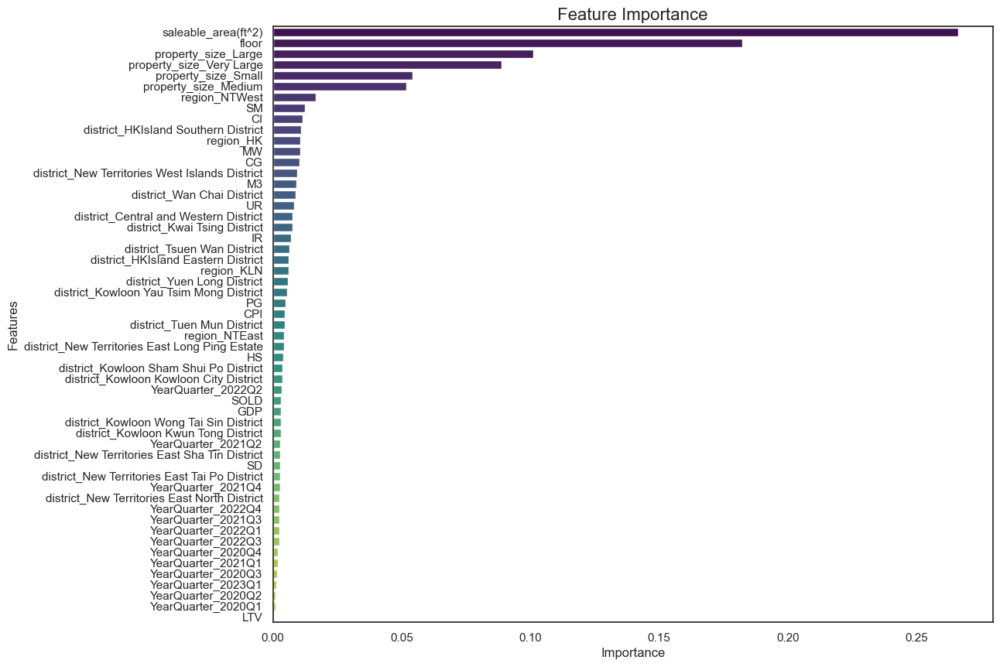

In [ ]:
# Sorting values based on 'Importance'
df_sorted = feature_importances.sort_values(by='Importance', ascending=False)

# Plotting the bar chart
plt.figure(figsize=(12, 10))
sns.barplot(x='Importance', y='Feature', data=df_sorted, palette='viridis')
plt.title('Feature Importance', fontsize=16)
plt.xlabel('Importance', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.show()

# Summarizing results
top_features = df_sorted.head(5)
bottom_features = df_sorted.tail(5)

top_features_summary = top_features[['Feature', 'Importance']]
bottom_features_summary = bottom_features[['Feature', 'Importance']]


## FInding the Best FS method, Selecting the best FS method

In [ ]:
from sklearn.feature_selection import RFE, mutual_info_regression
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, f_regression

# Feature Selection Methods
def recursive_feature_elimination(X, y, estimator, k=5):
    selector = RFE(estimator, n_features_to_select=k)
    selector.fit(X, y)
    return X.loc[:, selector.support_]

def mutual_information(X, y, k=5):
    mi = mutual_info_regression(X, y)
    mi_indices = np.argsort(mi)[-k:]
    return X.iloc[:, mi_indices]


def tree_based_importance(X, y, model, k=5):
    model.fit(X, y)
    importances = model.feature_importances_
    indices = np.argsort(importances)[-k:]
    return X.iloc[:, indices]

# Models and Regressors
models = [
    "Linear Regression",
    "Decision Tree Regressor",
    "Random Forest Regressor",
    "AdaBoost Regressor",
    "Extra Trees Regressor",
    "Gradient Boosting Regressor",
    "XGBoost Regressor",
    "MLP Regressor"
]

regressors = [
    LinearRegression(),
    DecisionTreeRegressor(random_state=42),
    RandomForestRegressor(random_state=42, n_estimators=100),
    AdaBoostRegressor(DecisionTreeRegressor(random_state=42, max_depth=10), n_estimators=50),
    ExtraTreesRegressor(random_state=42, n_estimators=100),
    GradientBoostingRegressor(random_state=42),
    XGBRegressor(random_state=42),
    MLPRegressor(random_state=42, hidden_layer_sizes=(50, 25), max_iter=1000)
]

# Feature Selection Techniques
feature_selection_methods = {
    "RFE": recursive_feature_elimination,
    "Mutual Information": mutual_information,
    "Tree-Based Importance": tree_based_importance,
}

In [ ]:

X_train, X_test, y_train, y_test = train_test_split(features, targets_120, test_size=0.2, random_state=42)

# Results DataFrames
new_price_results = pd.DataFrame(columns=["Feature Selection", "Model", "Train R²", "Test R²", "MAE", "MSE", "RMSE", "MAPE"])
pi_results = pd.DataFrame(columns=["Feature Selection", "Model", "Train R²", "Test R²", "MAE", "MSE", "RMSE", "MAPE"])

scaler_y = MinMaxScaler()

# Iterate over each target variable
for target_name in y.columns:
    y_train_target = scaler_y.fit_transform(y_train[[target_name]])
    y_test_target = scaler_y.transform(y_test[[target_name]])

    for method_name, method_func in feature_selection_methods.items():
        print(f"\nFeature Selection: {method_name}\n{'='*120}")

        # Apply Feature Selection
        if method_name in ["RFE", "Tree-Based Importance"]:
            selected_X_train = method_func(X_train, y_train_target.ravel(), RandomForestRegressor())
            selected_X_test = X_test[selected_X_train.columns]
        else:
            selected_X_train = method_func(X_train, y_train_target.ravel())
            selected_X_test = method_func(X_test, y_test_target.ravel())

        # Train each model
        for regressor, model in zip(regressors, models):
            regressor.fit(selected_X_train, y_train_target.ravel())
            train_pred = regressor.predict(selected_X_train)
            test_pred = regressor.predict(selected_X_test)

            train_r2 = r2_score(y_train_target, train_pred)
            test_r2 = r2_score(y_test_target, test_pred)
            mae = mean_absolute_error(y_test_target, test_pred)
            mse = mean_squared_error(y_test_target, test_pred)
            rmse = np.sqrt(mse)
            mape = np.mean(np.abs((y_test_target.flatten() - test_pred.flatten()) / y_test_target.flatten())) * 100

            result = [method_name, model, train_r2, test_r2, mae, mse, rmse, mape]

            if target_name == 'new_price':
                new_price_results.loc[len(new_price_results)] = result
            else:
                pi_results.loc[len(pi_results)] = result


Feature Selection: RFE

Feature Selection: Mutual Information

Feature Selection: Tree-Based Importance

Feature Selection: RFE

Feature Selection: Mutual Information

Feature Selection: Tree-Based Importance


In [ ]:
# Display Results
print("\nResults for Target: new_price")
display(new_price_results)


Results for Target: new_price


,Feature Selection,Model,Train R²,Test R²,MAE,MSE,RMSE,MAPE
0,RFE,Linear Regression,0.347116,0.354227,0.106336,0.020278,0.142400,32.844820
1,RFE,Decision Tree Regressor,0.899227,0.468933,0.074208,0.016676,0.129135,20.929463
2,RFE,Random Forest Regressor,0.867874,0.617405,0.067743,0.012014,0.109608,19.400372
3,RFE,AdaBoost Regressor,0.328784,0.318113,0.116308,0.021412,0.146328,37.076400
4,RFE,Extra Trees Regressor,0.899227,0.577342,0.068574,0.013272,0.115203,19.438895
5,RFE,Gradient Boosting Regressor,0.423284,0.429628,0.100469,0.017910,0.133829,30.283792
6,RFE,XGBoost Regressor,0.578650,0.536851,0.088629,0.014543,0.120596,26.407873
7,RFE,MLP Regressor,0.380711,0.389327,0.104272,0.019176,0.138476,32.299843
8,Mutual Information,Linear Regression,0.335248,0.182319,0.126958,0.025676,0.160237,44.778463
9,Mutual Information,Decision Tree Regressor,0.899227,-0.227549,0.152600,0.038546,0.196332,48.979155


In [ ]:
print("\nResults for Target: PI")
display(pi_results)


Results for Target: PI


,Feature Selection,Model,Train R²,Test R²,MAE,MSE,RMSE,MAPE
0,RFE,Linear Regression,0.860781,0.861332,1.097391e-01,1.785811e-02,1.336342e-01,inf
1,RFE,Decision Tree Regressor,1.000000,1.000000,4.539285e-14,2.979702e-27,5.458665e-14,NaN
2,RFE,Random Forest Regressor,1.000000,1.000000,1.791745e-14,5.747823e-28,2.397462e-14,NaN
3,RFE,AdaBoost Regressor,1.000000,1.000000,4.553509e-14,3.005405e-27,5.482158e-14,NaN
4,RFE,Extra Trees Regressor,1.000000,1.000000,4.567317e-14,3.015197e-27,5.491081e-14,NaN
5,RFE,Gradient Boosting Regressor,1.000000,1.000000,7.277521e-05,2.624909e-08,1.620157e-04,inf
6,RFE,XGBoost Regressor,1.000000,1.000000,4.370787e-06,2.564124e-11,5.063718e-06,inf
7,RFE,MLP Regressor,0.999993,0.999993,4.664334e-04,8.442596e-07,9.188360e-04,inf
8,Mutual Information,Linear Regression,0.951300,0.182003,2.894866e-01,1.053439e-01,3.245673e-01,inf
9,Mutual Information,Decision Tree Regressor,1.000000,0.273320,2.182340e-01,9.358383e-02,3.059147e-01,NaN


##  Tree-Based Importance FS method is the best FS method.

---

## Deep Learning Model


Training regression model for target variable: new_price

Epoch 1/100
151/151 - 3s - loss: 1.1438 - mse: 1.1438 - val_loss: 0.0577 - val_mse: 0.0577 - lr: 9.0000e-04 - 3s/epoch - 20ms/step
Epoch 2/100
151/151 - 1s - loss: 0.4532 - mse: 0.4532 - val_loss: 0.0360 - val_mse: 0.0360 - lr: 9.0000e-04 - 1s/epoch - 7ms/step
Epoch 3/100
151/151 - 1s - loss: 0.2535 - mse: 0.2535 - val_loss: 0.0297 - val_mse: 0.0297 - lr: 9.0000e-04 - 995ms/epoch - 7ms/step
Epoch 4/100
151/151 - 1s - loss: 0.1559 - mse: 0.1559 - val_loss: 0.0268 - val_mse: 0.0268 - lr: 9.0000e-04 - 960ms/epoch - 6ms/step
Epoch 5/100
151/151 - 1s - loss: 0.1021 - mse: 0.1021 - val_loss: 0.0253 - val_mse: 0.0253 - lr: 9.0000e-04 - 1s/epoch - 7ms/step
Epoch 6/100
151/151 - 1s - loss: 0.0718 - mse: 0.0718 - val_loss: 0.0245 - val_mse: 0.0245 - lr: 9.0000e-04 - 1s/epoch - 7ms/step
Epoch 7/100
151/151 - 1s - loss: 0.0531 - mse: 0.0531 - val_loss: 0.0241 - val_mse: 0.0241 - lr: 9.0000e-04 - 995ms/epoch - 7ms/step
Epoch 8/100
151/151 -

Epoch 61/100
151/151 - 1s - loss: 0.0173 - mse: 0.0173 - val_loss: 0.0162 - val_mse: 0.0162 - lr: 9.0000e-04 - 1s/epoch - 7ms/step
Epoch 62/100
151/151 - 1s - loss: 0.0174 - mse: 0.0174 - val_loss: 0.0157 - val_mse: 0.0157 - lr: 9.0000e-04 - 1s/epoch - 7ms/step
Epoch 63/100

Epoch 63: ReduceLROnPlateau reducing learning rate to 0.00044999999227002263.
151/151 - 1s - loss: 0.0172 - mse: 0.0172 - val_loss: 0.0157 - val_mse: 0.0157 - lr: 9.0000e-04 - 1s/epoch - 8ms/step
Epoch 64/100
151/151 - 1s - loss: 0.0171 - mse: 0.0171 - val_loss: 0.0158 - val_mse: 0.0158 - lr: 4.5000e-04 - 1s/epoch - 7ms/step
Epoch 65/100
151/151 - 1s - loss: 0.0170 - mse: 0.0170 - val_loss: 0.0155 - val_mse: 0.0155 - lr: 4.5000e-04 - 1s/epoch - 9ms/step
Epoch 66/100
151/151 - 1s - loss: 0.0170 - mse: 0.0170 - val_loss: 0.0156 - val_mse: 0.0156 - lr: 4.5000e-04 - 1s/epoch - 7ms/step
Epoch 67/100
151/151 - 1s - loss: 0.0170 - mse: 0.0170 - val_loss: 0.0155 - val_mse: 0.0155 - lr: 4.5000e-04 - 1s/epoch - 7ms/step
Epoc

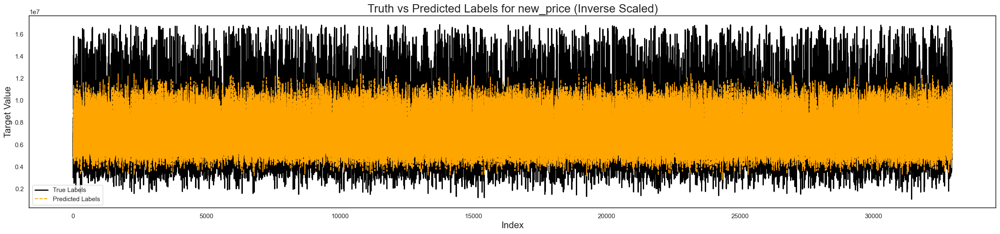

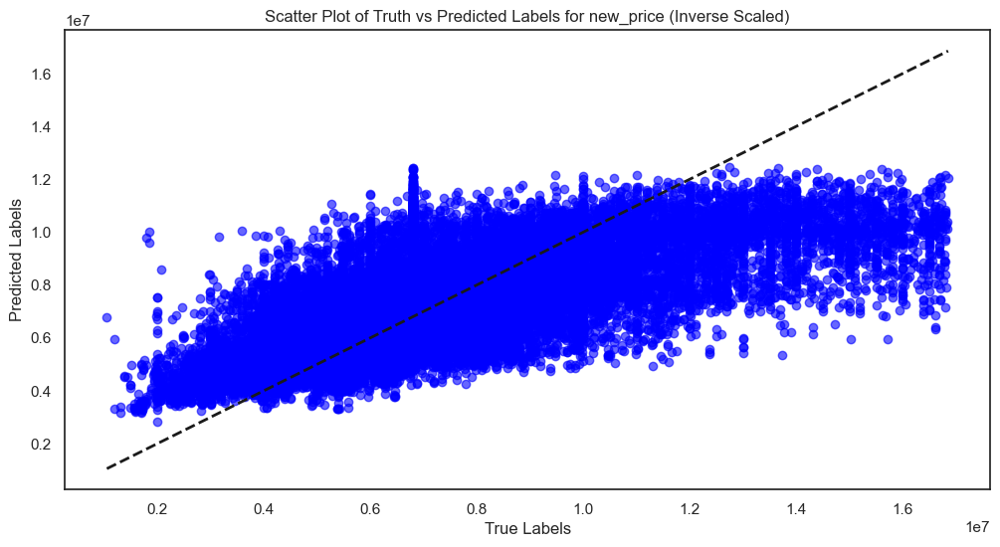


Training regression model for target variable: PI

Epoch 1/100
151/151 - 3s - loss: 1.2259 - mse: 1.2259 - val_loss: 0.0459 - val_mse: 0.0459 - lr: 9.0000e-04 - 3s/epoch - 22ms/step
Epoch 2/100
151/151 - 1s - loss: 0.4328 - mse: 0.4328 - val_loss: 0.0193 - val_mse: 0.0193 - lr: 9.0000e-04 - 1s/epoch - 7ms/step
Epoch 3/100
151/151 - 1s - loss: 0.2409 - mse: 0.2409 - val_loss: 0.0065 - val_mse: 0.0065 - lr: 9.0000e-04 - 1s/epoch - 7ms/step
Epoch 4/100
151/151 - 1s - loss: 0.1464 - mse: 0.1464 - val_loss: 0.0033 - val_mse: 0.0033 - lr: 9.0000e-04 - 1s/epoch - 7ms/step
Epoch 5/100
151/151 - 1s - loss: 0.0922 - mse: 0.0922 - val_loss: 0.0023 - val_mse: 0.0023 - lr: 9.0000e-04 - 1s/epoch - 7ms/step
Epoch 6/100
151/151 - 1s - loss: 0.0611 - mse: 0.0611 - val_loss: 0.0017 - val_mse: 0.0017 - lr: 9.0000e-04 - 1s/epoch - 7ms/step
Epoch 7/100
151/151 - 1s - loss: 0.0429 - mse: 0.0429 - val_loss: 0.0017 - val_mse: 0.0017 - lr: 9.0000e-04 - 1s/epoch - 7ms/step
Epoch 8/100
151/151 - 1s - loss: 0.03

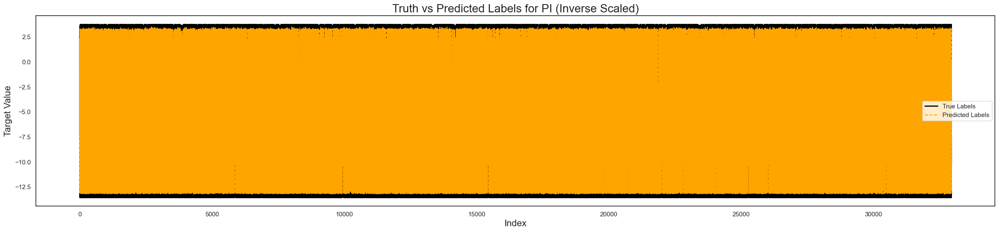

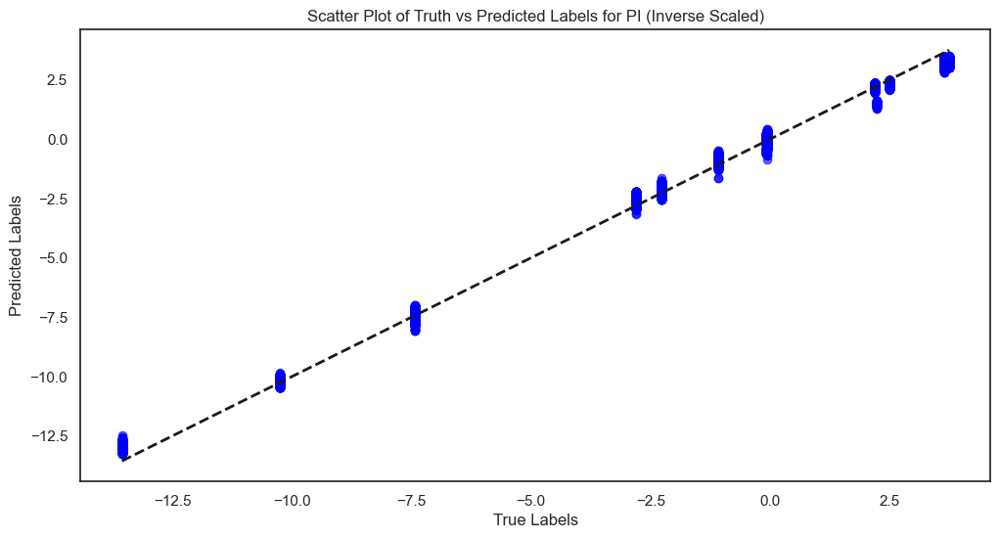

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler


# Initialize performance metrics storage
train_r2, test_r2 = [], []
mae, mse, rmse, mape = [], [], [], []

# Initialize dataframes to store results
new_price_results = pd.DataFrame(columns=["Model", "Train R²", "Test R²", "MAE", "MSE", "RMSE", "MAPE"])
pi_results = pd.DataFrame(columns=["Model", "Train R²", "Test R²", "MAE", "MSE", "RMSE", "MAPE"])

# Scale input features and targets
scaler_x = MinMaxScaler()
scaler_y = MinMaxScaler()

X_train_scaled = scaler_x.fit_transform(X_train)
X_test_scaled = scaler_x.transform(X_test)

# Iterate over each target variable
for target_idx, target_name in enumerate(targets_120.columns):
    print(f"\n{'='*125}")
    print(f"Training regression model for target variable: {target_name}")
    print(f"{'='*125}\n")

    # Scale the target variable
    y_train_scaled = scaler_y.fit_transform(y_train[[target_name]])
    y_test_scaled = scaler_y.transform(y_test[[target_name]])

    # Define the model architecture
    model = models.Sequential([
        layers.InputLayer(input_shape=(X_train_scaled.shape[1],)),
        layers.Dense(128, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.3),
        layers.Dense(64, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.3),
        layers.Dense(32, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.3),
        layers.Dense(16, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.3),
        layers.Dense(1, activation = 'linear')  # Regression output
    ])

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=0.0009),
                  loss='mean_squared_error',
                  metrics=['mse'])

    # Define callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=2)

    # Train the model
    history = model.fit(X_train_scaled, y_train_scaled,
                        validation_data=(X_test_scaled, y_test_scaled),
                        epochs=100, batch_size=512,
                        callbacks=[early_stopping, lr_scheduler],
                        verbose=2)

    # Predict on training and test data
    y_train_pred = model.predict(X_train_scaled)
    y_test_pred = model.predict(X_test_scaled)

    # Inverse scale predictions and true values
    y_train_rescaled = scaler_y.inverse_transform(y_train_scaled)
    y_test_rescaled = scaler_y.inverse_transform(y_test_scaled)
    train_prediction_rescaled = scaler_y.inverse_transform(y_train_pred)
    test_prediction_rescaled = scaler_y.inverse_transform(y_test_pred)


    # Calculate metrics BEFORE inverse scaling
    train_r2_score = r2_score(y_train_scaled, y_train_pred)
    test_r2_score = r2_score(y_test_scaled, y_test_pred)
    mae_val = mean_absolute_error(y_test_scaled, y_test_pred)
    mse_val = mean_squared_error(y_test_scaled, y_test_pred)
    rmse_val = np.sqrt(mse_val)


    # Ensure arrays are 1D
    y_test_target_flat = y_test_scaled.flatten()
    test_prediction_flat = y_test_pred.flatten()

    # Avoid division by zero
    denominator = np.where(y_test_target_flat == 0, 1, y_test_target_flat)

    # Compute MAPE
    mape_val = np.mean(np.abs((y_test_target_flat - test_prediction_flat) / denominator)) * 100


    # Print metrics BEFORE inverse scaling
    print(f"Metrics BEFORE Inverse Scaling for Target: {target_name}")
    print(f"Train R²: {train_r2_score:.4f}")
    print(f"Test R²: {test_r2_score:.4f}")
    print(f"MAE: {mae_val:.4f}")
    print(f"MSE: {mse_val:.4f}")
    print(f"RMSE: {rmse_val:.4f}")
    print(f"MAPE: {mape_val:.2f}%")

    # Append metrics
    train_r2.append(train_r2_score)
    test_r2.append(test_r2_score)
    mae.append(mae_val)
    mse.append(mse_val)
    rmse.append(rmse_val)
    mape.append(mape_val)

    # Print metrics
    print(f"\nMetrics for {target_name}:")
    print(f"Train R²: {train_r2_score:.4f}")
    print(f"Test R²: {test_r2_score:.4f}")
    print(f"MAE: {mae_val:.4f}")
    print(f"MSE: {mse_val:.4f}")
    print(f"RMSE: {rmse_val:.4f}")
    print(f"MAPE: {mape_val:.2f}%")

    # Line plot of truth vs predicted labels
    plt.figure(figsize=(30, 6))
    plt.plot(range(len(y_test_rescaled)), y_test_rescaled, label='True Labels', color='black', linewidth=2)
    plt.plot(range(len(test_prediction_rescaled)), test_prediction_rescaled, label='Predicted Labels', color='orange', linestyle='--')
    plt.title(f'Truth vs Predicted Labels for {target_name} (Inverse Scaled)', fontsize=20)
    plt.xlabel('Index', fontsize=16)
    plt.ylabel('Target Value', fontsize=16)
    plt.legend()
    plt.show()

    # Scatter plot of truth vs predicted labels
    plt.figure(figsize=(12, 6))
    plt.scatter(y_test_rescaled, test_prediction_rescaled, alpha=0.6, color='blue')
    plt.plot([y_test_rescaled.min(), y_test_rescaled.max()], [y_test_rescaled.min(), y_test_rescaled.max()], 'k--', lw=2)
    plt.title(f'Scatter Plot of Truth vs Predicted Labels for {target_name} (Inverse Scaled)')
    plt.xlabel('True Labels')
    plt.ylabel('Predicted Labels')
    plt.show()

    # Store results in respective DataFrames
    result_row = {"Model": "Enhanced Deep Learning",
                  "Train R²": train_r2_score,
                  "Test R²": test_r2_score,
                  "MAE": mae_val,
                  "MSE": mse_val,
                  "RMSE": rmse_val,
                  "MAPE": mape_val}

    if target_name == 'new_price':
        new_price_results = pd.concat([new_price_results, pd.DataFrame([result_row])], ignore_index=True)
    else:
        pi_results = pd.concat([pi_results, pd.DataFrame([result_row])], ignore_index=True)

In [ ]:
# Display results tables
print("\nResults for 'new_price' Target:")
display(new_price_results)
print("\nResults for 'PI' Target:")
display(pi_results)


Results for 'new_price' Target:


,Model,Train R²,Test R²,MAE,MSE,RMSE,MAPE
0,Enhanced Deep Learning,0.51459,0.509037,0.09059,0.015287,0.123639,27.771738



Results for 'PI' Target:


,Model,Train R²,Test R²,MAE,MSE,RMSE,MAPE
0,Enhanced Deep Learning,0.997606,0.997602,0.013792,0.000309,0.017582,2.188357


## LSTM

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Initialize performance metrics storage
train_r2, test_r2 = [], []
mae, mse, rmse, mape = [], [], [], []

# Initialize dataframes to store results
new_price_results = pd.DataFrame(columns=["Model", "Train R²", "Test R²", "MAE", "MSE", "RMSE", "MAPE"])
pi_results = pd.DataFrame(columns=["Model", "Train R²", "Test R²", "MAE", "MSE", "RMSE", "MAPE"])

# Scale input features and targets
scaler_x = MinMaxScaler()
scaler_y = MinMaxScaler()

X_train_scaled = scaler_x.fit_transform(X_train)
X_test_scaled = scaler_x.transform(X_test)

# Reshape input features for LSTM (samples, time_steps, features)
X_train_lstm = X_train_scaled.reshape((X_train_scaled.shape[0], X_train_scaled.shape[1], 1))
X_test_lstm = X_test_scaled.reshape((X_test_scaled.shape[0], X_test_scaled.shape[1], 1))



Training LSTM model for target variable: new_price

Epoch 1/100
1202/1202 - 73s - loss: 0.3676 - mse: 0.3676 - val_loss: 0.0312 - val_mse: 0.0312 - lr: 5.0000e-04 - 73s/epoch - 60ms/step
Epoch 2/100
1202/1202 - 74s - loss: 0.0432 - mse: 0.0432 - val_loss: 0.0290 - val_mse: 0.0290 - lr: 5.0000e-04 - 74s/epoch - 61ms/step
Epoch 3/100
1202/1202 - 77s - loss: 0.0276 - mse: 0.0276 - val_loss: 0.0545 - val_mse: 0.0545 - lr: 5.0000e-04 - 77s/epoch - 64ms/step
Epoch 4/100
1202/1202 - 82s - loss: 0.0221 - mse: 0.0221 - val_loss: 0.8256 - val_mse: 0.8256 - lr: 5.0000e-04 - 82s/epoch - 69ms/step
Epoch 5/100
1202/1202 - 88s - loss: 0.0208 - mse: 0.0208 - val_loss: 0.0236 - val_mse: 0.0236 - lr: 5.0000e-04 - 88s/epoch - 73ms/step
Epoch 6/100
1202/1202 - 94s - loss: 0.0205 - mse: 0.0205 - val_loss: 0.0357 - val_mse: 0.0357 - lr: 5.0000e-04 - 94s/epoch - 78ms/step
Epoch 7/100
1202/1202 - 88s - loss: 0.0202 - mse: 0.0202 - val_loss: 0.0256 - val_mse: 0.0256 - lr: 5.0000e-04 - 88s/epoch - 73ms/step
Ep

Epoch 56/100
1202/1202 - 128s - loss: 0.0179 - mse: 0.0179 - val_loss: 0.0169 - val_mse: 0.0169 - lr: 1.5625e-05 - 128s/epoch - 106ms/step
Epoch 57/100
1202/1202 - 127s - loss: 0.0180 - mse: 0.0180 - val_loss: 0.0169 - val_mse: 0.0169 - lr: 1.5625e-05 - 127s/epoch - 106ms/step
Epoch 58/100
1202/1202 - 127s - loss: 0.0180 - mse: 0.0180 - val_loss: 0.0180 - val_mse: 0.0180 - lr: 1.5625e-05 - 127s/epoch - 105ms/step
Epoch 59/100
1202/1202 - 135s - loss: 0.0180 - mse: 0.0180 - val_loss: 0.0188 - val_mse: 0.0188 - lr: 1.5625e-05 - 135s/epoch - 113ms/step
Epoch 60/100

Epoch 60: ReduceLROnPlateau reducing learning rate to 7.812500371073838e-06.
1202/1202 - 138s - loss: 0.0180 - mse: 0.0180 - val_loss: 0.0170 - val_mse: 0.0170 - lr: 1.5625e-05 - 138s/epoch - 115ms/step
Epoch 61/100
1202/1202 - 132s - loss: 0.0180 - mse: 0.0180 - val_loss: 0.0172 - val_mse: 0.0172 - lr: 7.8125e-06 - 132s/epoch - 110ms/step
Epoch 62/100
1202/1202 - 136s - loss: 0.0179 - mse: 0.0179 - val_loss: 0.0168 - val_mse:

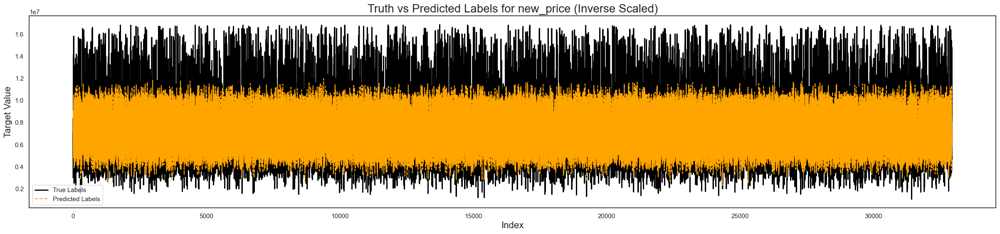

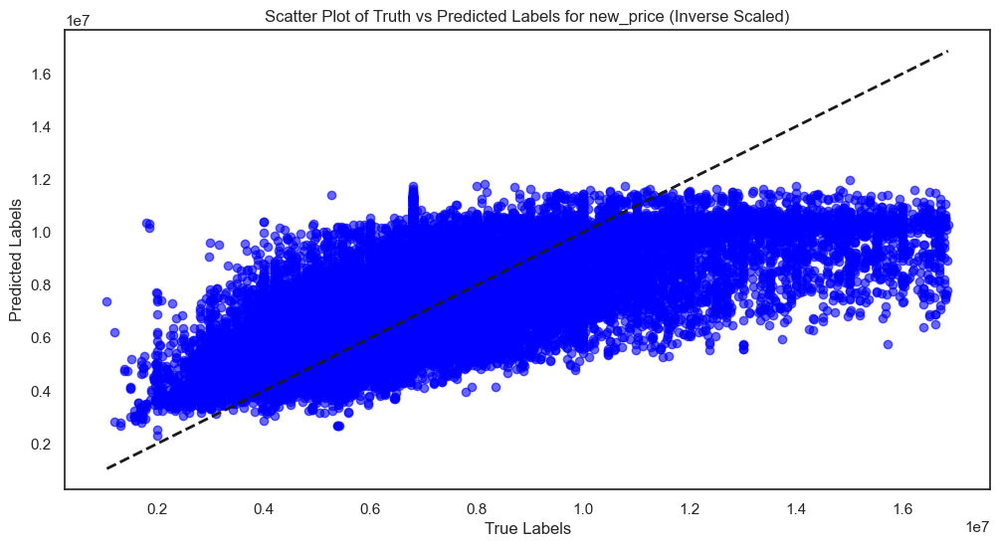


Training LSTM model for target variable: PI

Epoch 1/100
1202/1202 - 326s - loss: 0.4203 - mse: 0.4203 - val_loss: 0.0063 - val_mse: 0.0063 - lr: 5.0000e-04 - 326s/epoch - 272ms/step
Epoch 2/100
1202/1202 - 321s - loss: 0.0352 - mse: 0.0352 - val_loss: 0.0324 - val_mse: 0.0324 - lr: 5.0000e-04 - 321s/epoch - 267ms/step
Epoch 3/100
1202/1202 - 320s - loss: 0.0108 - mse: 0.0108 - val_loss: 0.2622 - val_mse: 0.2622 - lr: 5.0000e-04 - 320s/epoch - 266ms/step
Epoch 4/100
1202/1202 - 320s - loss: 0.0084 - mse: 0.0084 - val_loss: 0.0047 - val_mse: 0.0047 - lr: 5.0000e-04 - 320s/epoch - 266ms/step
Epoch 5/100
1202/1202 - 321s - loss: 0.0079 - mse: 0.0079 - val_loss: 0.0162 - val_mse: 0.0162 - lr: 5.0000e-04 - 321s/epoch - 267ms/step
Epoch 6/100
1202/1202 - 322s - loss: 0.0073 - mse: 0.0073 - val_loss: 0.0430 - val_mse: 0.0430 - lr: 5.0000e-04 - 322s/epoch - 268ms/step
Epoch 7/100
1202/1202 - 324s - loss: 0.0065 - mse: 0.0065 - val_loss: 0.1039 - val_mse: 0.1039 - lr: 5.0000e-04 - 324s/epoch -


Epoch 52: ReduceLROnPlateau reducing learning rate to 9.765625463842298e-07.
1202/1202 - 406s - loss: 0.0049 - mse: 0.0049 - val_loss: 1.0118e-04 - val_mse: 1.0118e-04 - lr: 1.9531e-06 - 406s/epoch - 338ms/step
Epoch 53/100
1202/1202 - 370s - loss: 0.0050 - mse: 0.0050 - val_loss: 8.0521e-05 - val_mse: 8.0521e-05 - lr: 9.7656e-07 - 370s/epoch - 308ms/step
Epoch 54/100
1202/1202 - 376s - loss: 0.0050 - mse: 0.0050 - val_loss: 1.2823e-04 - val_mse: 1.2823e-04 - lr: 9.7656e-07 - 376s/epoch - 313ms/step
Epoch 55/100
1202/1202 - 383s - loss: 0.0050 - mse: 0.0050 - val_loss: 9.3445e-05 - val_mse: 9.3445e-05 - lr: 9.7656e-07 - 383s/epoch - 318ms/step
Epoch 56/100
1202/1202 - 386s - loss: 0.0049 - mse: 0.0049 - val_loss: 1.4672e-04 - val_mse: 1.4672e-04 - lr: 9.7656e-07 - 386s/epoch - 321ms/step
Epoch 57/100

Epoch 57: ReduceLROnPlateau reducing learning rate to 4.882812731921149e-07.
1202/1202 - 387s - loss: 0.0050 - mse: 0.0050 - val_loss: 1.8074e-04 - val_mse: 1.8074e-04 - lr: 9.7656e-07 -

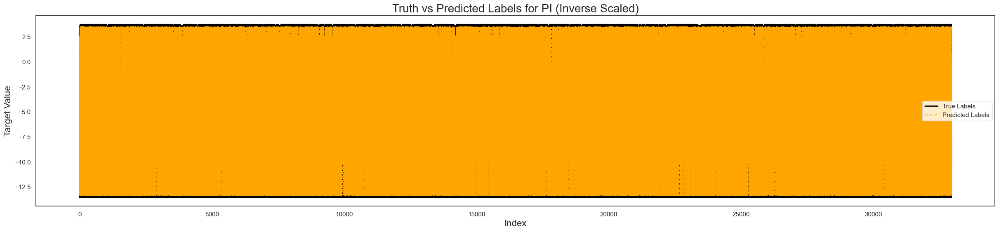

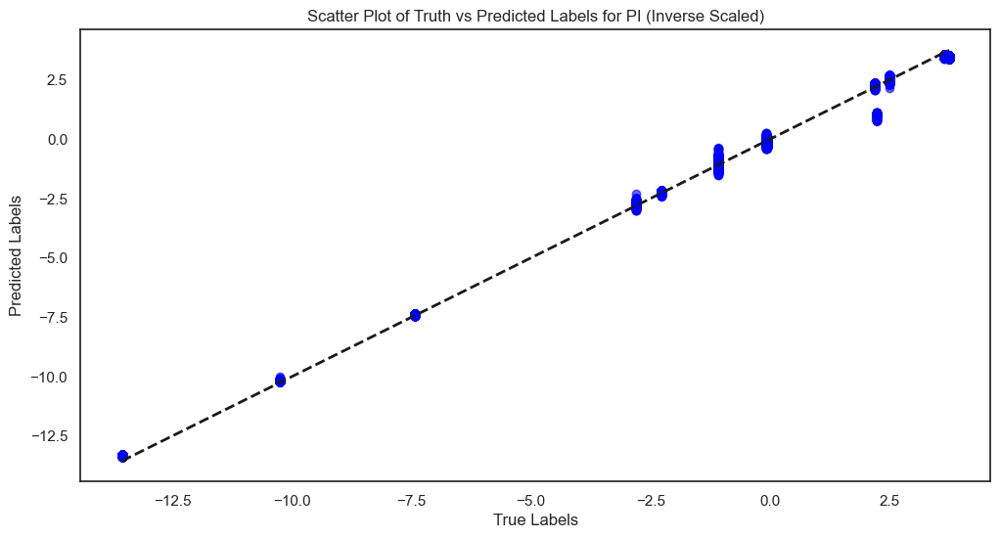

In [ ]:


# Iterate over each target variable
for target_idx, target_name in enumerate(targets_120.columns):
    print(f"\n{'='*125}")
    print(f"Training LSTM model for target variable: {target_name}")
    print(f"{'='*125}\n")

    # Scale the target variable
    y_train_scaled = scaler_y.fit_transform(y_train[[target_name]])
    y_test_scaled = scaler_y.transform(y_test[[target_name]])

    # Define the LSTM-based model architecture
    model = models.Sequential([
        layers.InputLayer(input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])),
        layers.LSTM(128, activation='tanh', return_sequences=False),
        layers.BatchNormalization(),
        layers.Dropout(0.3),
        layers.Dense(64, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.3),
        layers.Dense(32, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.3),
        layers.Dense(1, activation='linear')  # Regression output
    ])

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=0.0005),
                  loss='mean_squared_error',
                  metrics=['mse'])

    # Define callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

    # Train the model
    history = model.fit(X_train_lstm, y_train_scaled,
                        validation_data=(X_test_lstm, y_test_scaled),
                        epochs=100, batch_size=64,
                        callbacks=[early_stopping, lr_scheduler],
                        verbose=2)

    # Predict on training and test data
    y_train_pred = model.predict(X_train_lstm)
    y_test_pred = model.predict(X_test_lstm)

    # Inverse scale predictions and true values
    y_train_rescaled = scaler_y.inverse_transform(y_train_scaled)
    y_test_rescaled = scaler_y.inverse_transform(y_test_scaled)
    train_prediction_rescaled = scaler_y.inverse_transform(y_train_pred)
    test_prediction_rescaled = scaler_y.inverse_transform(y_test_pred)

    # Calculate metrics BEFORE inverse scaling
    train_r2_score = r2_score(y_train_scaled, y_train_pred)
    test_r2_score = r2_score(y_test_scaled, y_test_pred)
    mae_val = mean_absolute_error(y_test_scaled, y_test_pred)
    mse_val = mean_squared_error(y_test_scaled, y_test_pred)
    rmse_val = np.sqrt(mse_val)

    # Ensure arrays are 1D for MAPE calculation
    y_test_target_flat = y_test_scaled.flatten()
    test_prediction_flat = y_test_pred.flatten()

    # Avoid division by zero
    denominator = np.where(y_test_target_flat == 0, 1, y_test_target_flat)

    # Compute MAPE
    mape_val = np.mean(np.abs((y_test_target_flat - test_prediction_flat) / denominator)) * 100

    # Print metrics BEFORE inverse scaling
    print(f"Metrics BEFORE Inverse Scaling for Target: {target_name}")
    print(f"Train R²: {train_r2_score:.4f}")
    print(f"Test R²: {test_r2_score:.4f}")
    print(f"MAE: {mae_val:.4f}")
    print(f"MSE: {mse_val:.4f}")
    print(f"RMSE: {rmse_val:.4f}")
    print(f"MAPE: {mape_val:.2f}%")

    # Append metrics
    train_r2.append(train_r2_score)
    test_r2.append(test_r2_score)
    mae.append(mae_val)
    mse.append(mse_val)
    rmse.append(rmse_val)
    mape.append(mape_val)

    # Line plot of truth vs predicted labels
    plt.figure(figsize=(30, 6))
    plt.plot(range(len(y_test_rescaled)), y_test_rescaled, label='True Labels', color='black', linewidth=2)
    plt.plot(range(len(test_prediction_rescaled)), test_prediction_rescaled, label='Predicted Labels', color='orange', linestyle='--')
    plt.title(f'Truth vs Predicted Labels for {target_name} (Inverse Scaled)', fontsize=20)
    plt.xlabel('Index', fontsize=16)
    plt.ylabel('Target Value', fontsize=16)
    plt.legend()
    plt.show()

    # Scatter plot of truth vs predicted labels
    plt.figure(figsize=(12, 6))
    plt.scatter(y_test_rescaled, test_prediction_rescaled, alpha=0.6, color='blue')
    plt.plot([y_test_rescaled.min(), y_test_rescaled.max()], [y_test_rescaled.min(), y_test_rescaled.max()], 'k--', lw=2)
    plt.title(f'Scatter Plot of Truth vs Predicted Labels for {target_name} (Inverse Scaled)')
    plt.xlabel('True Labels')
    plt.ylabel('Predicted Labels')
    plt.show()

    # Store results in respective DataFrames
    result_row = {"Model": "LSTM Model",
                  "Train R²": train_r2_score,
                  "Test R²": test_r2_score,
                  "MAE": mae_val,
                  "MSE": mse_val,
                  "RMSE": rmse_val,
                  "MAPE": mape_val}

    if target_name == 'new_price':
        new_price_results = pd.concat([new_price_results, pd.DataFrame([result_row])], ignore_index=True)
    else:
        pi_results = pd.concat([pi_results, pd.DataFrame([result_row])], ignore_index=True)


## Bidirectional GRU


Training Bidirectional GRU model for target variable: new_price

Epoch 1/100
8/8 - 23s - loss: 1.7912 - mse: 1.7912 - val_loss: 0.1618 - val_mse: 0.1618 - lr: 1.0000e-05 - 23s/epoch - 3s/step
Epoch 2/100
8/8 - 14s - loss: 1.7372 - mse: 1.7372 - val_loss: 0.1491 - val_mse: 0.1491 - lr: 1.0000e-05 - 14s/epoch - 2s/step
Epoch 3/100
8/8 - 14s - loss: 1.7375 - mse: 1.7375 - val_loss: 0.1372 - val_mse: 0.1372 - lr: 1.0000e-05 - 14s/epoch - 2s/step
Epoch 4/100
8/8 - 14s - loss: 1.6881 - mse: 1.6881 - val_loss: 0.1255 - val_mse: 0.1255 - lr: 1.0000e-05 - 14s/epoch - 2s/step
Epoch 5/100
8/8 - 16s - loss: 1.6555 - mse: 1.6555 - val_loss: 0.1142 - val_mse: 0.1142 - lr: 1.0000e-05 - 16s/epoch - 2s/step
Epoch 6/100
8/8 - 15s - loss: 1.6058 - mse: 1.6058 - val_loss: 0.1034 - val_mse: 0.1034 - lr: 1.0000e-05 - 15s/epoch - 2s/step
Epoch 7/100
8/8 - 15s - loss: 1.6268 - mse: 1.6268 - val_loss: 0.0928 - val_mse: 0.0928 - lr: 1.0000e-05 - 15s/epoch - 2s/step
Epoch 8/100
8/8 - 15s - loss: 1.5818 - mse: 1

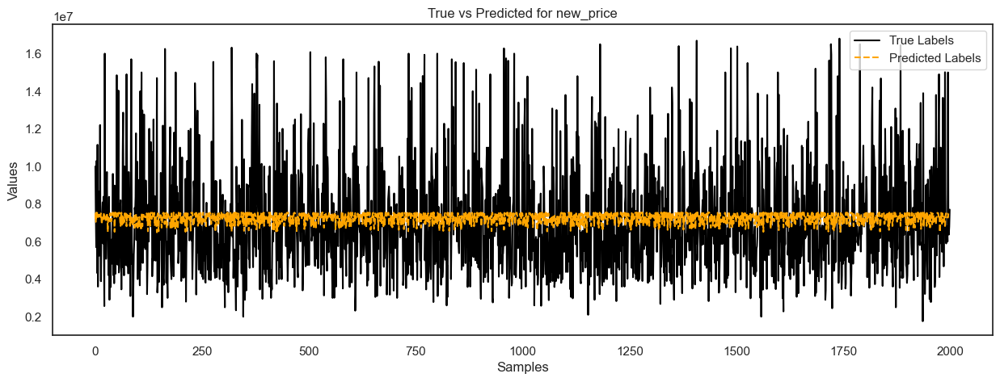

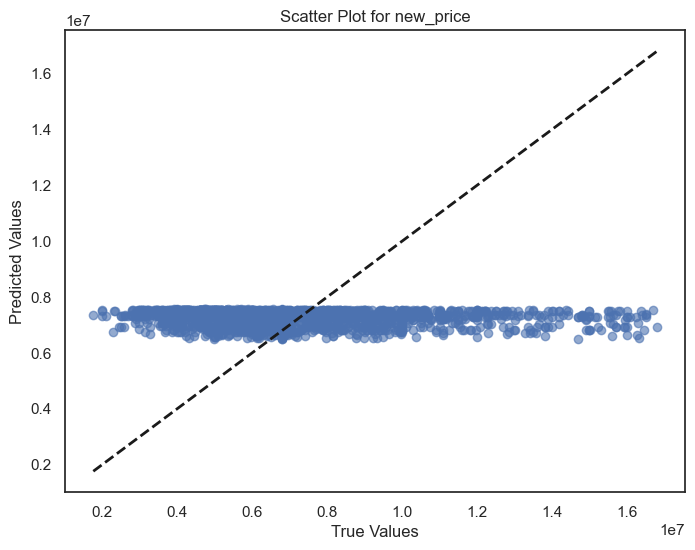


Training Bidirectional GRU model for target variable: PI

Epoch 1/100
8/8 - 22s - loss: 2.1643 - mse: 2.1643 - val_loss: 0.3792 - val_mse: 0.3792 - lr: 1.0000e-05 - 22s/epoch - 3s/step
Epoch 2/100
8/8 - 12s - loss: 2.0932 - mse: 2.0932 - val_loss: 0.3994 - val_mse: 0.3994 - lr: 1.0000e-05 - 12s/epoch - 2s/step
Epoch 3/100
8/8 - 12s - loss: 2.0542 - mse: 2.0542 - val_loss: 0.4206 - val_mse: 0.4206 - lr: 1.0000e-05 - 12s/epoch - 2s/step
Epoch 4/100
8/8 - 12s - loss: 1.9964 - mse: 1.9964 - val_loss: 0.4410 - val_mse: 0.4410 - lr: 1.0000e-05 - 12s/epoch - 2s/step
Epoch 5/100
8/8 - 12s - loss: 1.9826 - mse: 1.9826 - val_loss: 0.4610 - val_mse: 0.4610 - lr: 1.0000e-05 - 12s/epoch - 2s/step
Epoch 6/100

Epoch 6: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-06.
8/8 - 12s - loss: 1.8813 - mse: 1.8813 - val_loss: 0.4794 - val_mse: 0.4794 - lr: 1.0000e-05 - 12s/epoch - 2s/step
Epoch 7/100
8/8 - 12s - loss: 1.9374 - mse: 1.9374 - val_loss: 0.4971 - val_mse: 0.4971 - lr: 5.0000e-

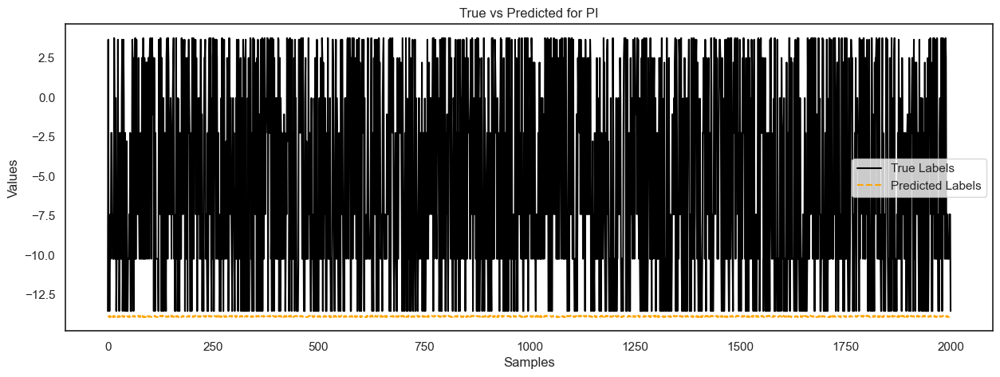

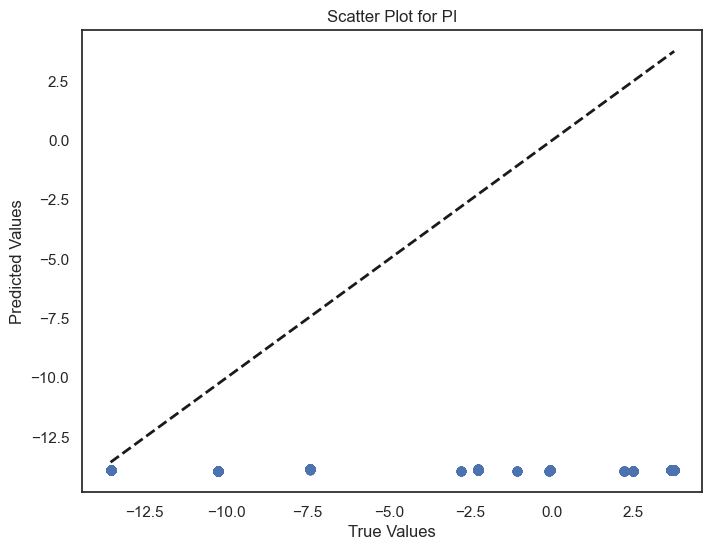

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Initialize performance metrics storage
train_r2, test_r2 = [], []
mae, mse, rmse, mape = [], [], [], []

# Initialize DataFrames to store results
new_price_results = pd.DataFrame(columns=["Model", "Train R²", "Test R²", "MAE", "MSE", "RMSE", "MAPE"])
pi_results = pd.DataFrame(columns=["Model", "Train R²", "Test R²", "MAE", "MSE", "RMSE", "MAPE"])

# Iterate over each target variable
for target_idx, target_name in enumerate(targets_120.columns):
    print(f"\n{'='*125}")
    print(f"Training Bidirectional GRU model for target variable: {target_name}")
    print(f"{'='*125}\n")

    # Scale target variable
    y_train_scaled = scaler_y.fit_transform(y_train[[target_name]])
    y_test_scaled = scaler_y.transform(y_test[[target_name]])

    # Define GRU-based model architecture
    model = models.Sequential([
        layers.InputLayer(input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])),

        # Bidirectional GRU Layer
        layers.Bidirectional(layers.GRU(64, return_sequences=True)),
        layers.BatchNormalization(),
        layers.Dropout(0.1),

        # LSTM Layer
        layers.LSTM(32, activation='tanh', return_sequences=False),
        layers.BatchNormalization(),
        layers.Dropout(0.3),

        # Dense Layers
        layers.Dense(128, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.2),

        layers.Dense(32, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.2),

        layers.Dense(1, activation='linear')  # Regression output
    ])

    # Compile the model
    model.compile(optimizer=RMSprop(learning_rate=0.00001),
                  loss='mean_squared_error',
                  metrics=['mse'])

    # Define callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

    # Train the model
    history = model.fit(X_train_lstm, y_train_scaled,
                        validation_data=(X_test_lstm, y_test_scaled),
                        epochs=100, batch_size=1024,
                        callbacks=[early_stopping, lr_scheduler],
                        verbose=2)

    # Predict on training and test data
    y_train_pred = model.predict(X_train_lstm)
    y_test_pred = model.predict(X_test_lstm)

    # Inverse scaling
    y_train_rescaled = scaler_y.inverse_transform(y_train_scaled)
    y_test_rescaled = scaler_y.inverse_transform(y_test_scaled)
    train_prediction_rescaled = scaler_y.inverse_transform(y_train_pred)
    test_prediction_rescaled = scaler_y.inverse_transform(y_test_pred)

    # Calculate metrics BEFORE inverse scaling
    train_r2_score = r2_score(y_train_scaled, y_train_pred)
    test_r2_score = r2_score(y_test_scaled, y_test_pred)
    mae_val = mean_absolute_error(y_test_scaled, y_test_pred)
    mse_val = mean_squared_error(y_test_scaled, y_test_pred)
    rmse_val = np.sqrt(mse_val)

    # Ensure arrays are 1D for MAPE calculation
    y_test_target_flat = y_test_scaled.flatten()
    test_prediction_flat = y_test_pred.flatten()

    # Avoid division by zero
    denominator = np.where(y_test_target_flat == 0, 1, y_test_target_flat)

    # Compute MAPE
    mape_val = np.mean(np.abs((y_test_target_flat - test_prediction_flat) / denominator)) * 100

    # Print metrics BEFORE inverse scaling
    print(f"Metrics BEFORE Inverse Scaling for Target: {target_name}")
    print(f"Train R²: {train_r2_score:.4f}")
    print(f"Test R²: {test_r2_score:.4f}")
    print(f"MAE: {mae_val:.4f}")
    print(f"MSE: {mse_val:.4f}")
    print(f"RMSE: {rmse_val:.4f}")
    print(f"MAPE: {mape_val:.2f}%")

    # Append metrics
    train_r2.append(train_r2_score)
    test_r2.append(test_r2_score)
    mae.append(mae_val)
    mse.append(mse_val)
    rmse.append(rmse_val)
    mape.append(mape_val)


    # Plot true vs predicted values
    plt.figure(figsize=(15, 5))
    plt.plot(y_test_rescaled, label="True Labels", color='black')
    plt.plot(test_prediction_rescaled, label="Predicted Labels", color='orange', linestyle='--')
    plt.title(f"True vs Predicted for {target_name}")
    plt.xlabel("Samples")
    plt.ylabel("Values")
    plt.legend()
    plt.show()

    # Scatter plot
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test_rescaled, test_prediction_rescaled, alpha=0.6)
    plt.plot([y_test_rescaled.min(), y_test_rescaled.max()],
             [y_test_rescaled.min(), y_test_rescaled.max()], 'k--', lw=2)
    plt.title(f"Scatter Plot for {target_name}")
    plt.xlabel("True Values")
    plt.ylabel("Predicted Values")
    plt.show()

    # Store results
    result_row = {"Model": "Bidirectional GRU", "Train R²": train_r2_score, "Test R²": test_r2_score,
                  "MAE": mae_val, "MSE": mse_val, "RMSE": rmse_val, "MAPE": mape_val}

    if target_name == 'new_price':
        new_price_results = pd.concat([new_price_results, pd.DataFrame([result_row])], ignore_index=True)
    else:
        pi_results = pd.concat([pi_results, pd.DataFrame([result_row])], ignore_index=True)

In [ ]:
# Display results tables
print("\nResults for 'new_price' Target:")
display(new_price_results)


Results for 'new_price' Target:


,Model,Train R²,Test R²,MAE,MSE,RMSE,MAPE
0,Bidirectional GRU,-0.03527,-0.031162,0.139759,0.032949,0.181518,47.21773


In [ ]:
print("\nResults for 'PI' Target:")
display(pi_results)


Results for 'PI' Target:


,Model,Train R²,Test R²,MAE,MSE,RMSE,MAPE
0,Bidirectional GRU,-1.860186,-1.868776,0.497221,0.379175,0.615772,86.624384


## Bi-Directional LSTM-GRU-TDL


Training Hybrid Model (BiLSTM+LSTM+GRU+TDL) for target variable: new_price

Epoch 1/100
8/8 - 51s - loss: 2.5271 - mse: 2.5271 - val_loss: 0.1232 - val_mse: 0.1232 - lr: 5.0000e-04 - 51s/epoch - 6s/step
Epoch 2/100
8/8 - 41s - loss: 1.7000 - mse: 1.7000 - val_loss: 0.0797 - val_mse: 0.0797 - lr: 5.0000e-04 - 41s/epoch - 5s/step
Epoch 3/100
8/8 - 40s - loss: 1.4441 - mse: 1.4441 - val_loss: 0.0509 - val_mse: 0.0509 - lr: 5.0000e-04 - 40s/epoch - 5s/step
Epoch 4/100
8/8 - 43s - loss: 1.2793 - mse: 1.2793 - val_loss: 0.0352 - val_mse: 0.0352 - lr: 5.0000e-04 - 43s/epoch - 5s/step
Epoch 5/100
8/8 - 45s - loss: 1.1482 - mse: 1.1482 - val_loss: 0.0320 - val_mse: 0.0320 - lr: 5.0000e-04 - 45s/epoch - 6s/step
Epoch 6/100
8/8 - 47s - loss: 1.0238 - mse: 1.0238 - val_loss: 0.0365 - val_mse: 0.0365 - lr: 5.0000e-04 - 47s/epoch - 6s/step
Epoch 7/100
8/8 - 45s - loss: 0.9432 - mse: 0.9432 - val_loss: 0.0485 - val_mse: 0.0485 - lr: 5.0000e-04 - 45s/epoch - 6s/step
Epoch 8/100
8/8 - 53s - loss: 0.89

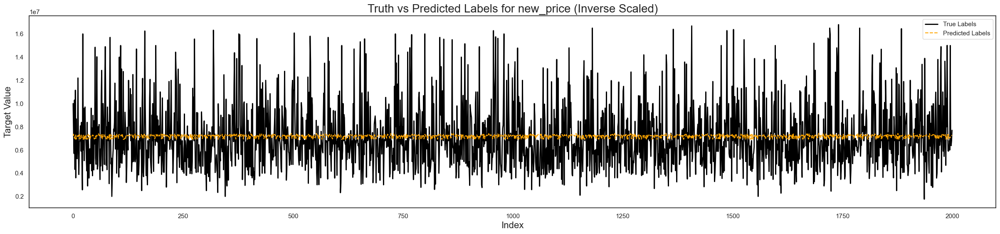

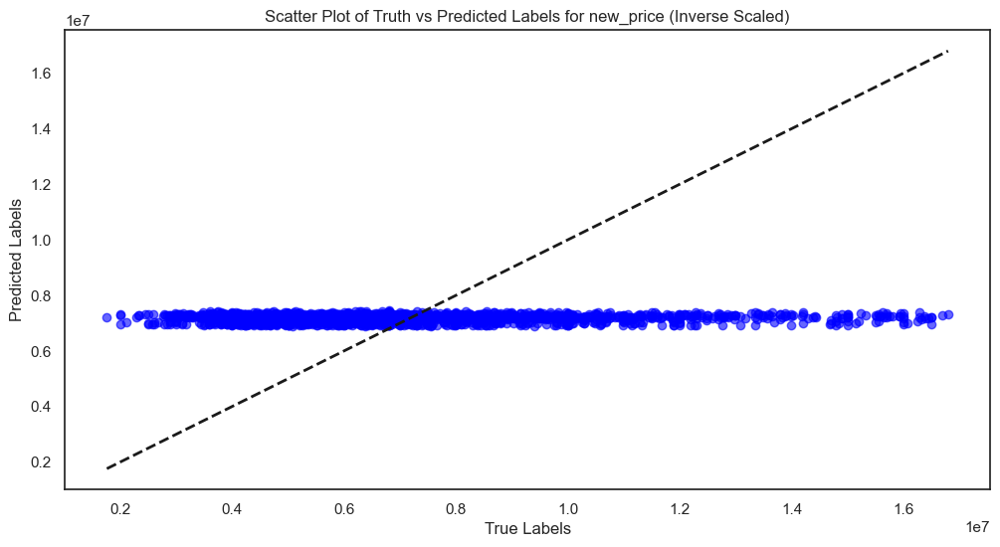


Training Hybrid Model (BiLSTM+LSTM+GRU+TDL) for target variable: PI

Epoch 1/100
8/8 - 51s - loss: 2.6561 - mse: 2.6561 - val_loss: 0.3242 - val_mse: 0.3242 - lr: 5.0000e-04 - 51s/epoch - 6s/step
Epoch 2/100
8/8 - 48s - loss: 1.8975 - mse: 1.8975 - val_loss: 0.2991 - val_mse: 0.2991 - lr: 5.0000e-04 - 48s/epoch - 6s/step
Epoch 3/100
8/8 - 69s - loss: 1.4970 - mse: 1.4970 - val_loss: 0.2791 - val_mse: 0.2791 - lr: 5.0000e-04 - 69s/epoch - 9s/step
Epoch 4/100
8/8 - 72s - loss: 1.3216 - mse: 1.3216 - val_loss: 0.2443 - val_mse: 0.2443 - lr: 5.0000e-04 - 72s/epoch - 9s/step
Epoch 5/100
8/8 - 70s - loss: 1.2009 - mse: 1.2009 - val_loss: 0.2273 - val_mse: 0.2273 - lr: 5.0000e-04 - 70s/epoch - 9s/step
Epoch 6/100
8/8 - 79s - loss: 1.0841 - mse: 1.0841 - val_loss: 0.2164 - val_mse: 0.2164 - lr: 5.0000e-04 - 79s/epoch - 10s/step
Epoch 7/100
8/8 - 66s - loss: 1.0132 - mse: 1.0132 - val_loss: 0.1954 - val_mse: 0.1954 - lr: 5.0000e-04 - 66s/epoch - 8s/step
Epoch 8/100
8/8 - 61s - loss: 0.9402 - m

Epoch 63/100
8/8 - 35s - loss: 0.0698 - mse: 0.0698 - val_loss: 0.0371 - val_mse: 0.0371 - lr: 5.0000e-04 - 35s/epoch - 4s/step
Epoch 64/100
8/8 - 35s - loss: 0.0681 - mse: 0.0681 - val_loss: 0.0417 - val_mse: 0.0417 - lr: 5.0000e-04 - 35s/epoch - 4s/step
Epoch 65/100
8/8 - 35s - loss: 0.0638 - mse: 0.0638 - val_loss: 0.0329 - val_mse: 0.0329 - lr: 5.0000e-04 - 35s/epoch - 4s/step
Epoch 66/100
8/8 - 35s - loss: 0.0611 - mse: 0.0611 - val_loss: 0.0282 - val_mse: 0.0282 - lr: 5.0000e-04 - 35s/epoch - 4s/step
Epoch 67/100
8/8 - 34s - loss: 0.0632 - mse: 0.0632 - val_loss: 0.0289 - val_mse: 0.0289 - lr: 5.0000e-04 - 34s/epoch - 4s/step
Epoch 68/100
8/8 - 35s - loss: 0.0586 - mse: 0.0586 - val_loss: 0.0300 - val_mse: 0.0300 - lr: 5.0000e-04 - 35s/epoch - 4s/step
Epoch 69/100
8/8 - 35s - loss: 0.0578 - mse: 0.0578 - val_loss: 0.0304 - val_mse: 0.0304 - lr: 5.0000e-04 - 35s/epoch - 4s/step
Epoch 70/100
8/8 - 35s - loss: 0.0555 - mse: 0.0555 - val_loss: 0.0236 - val_mse: 0.0236 - lr: 5.0000e-0

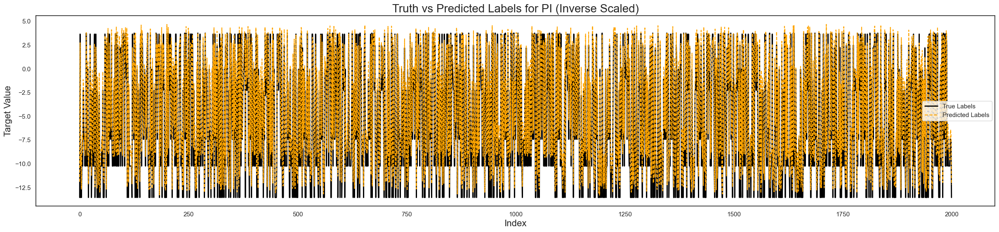

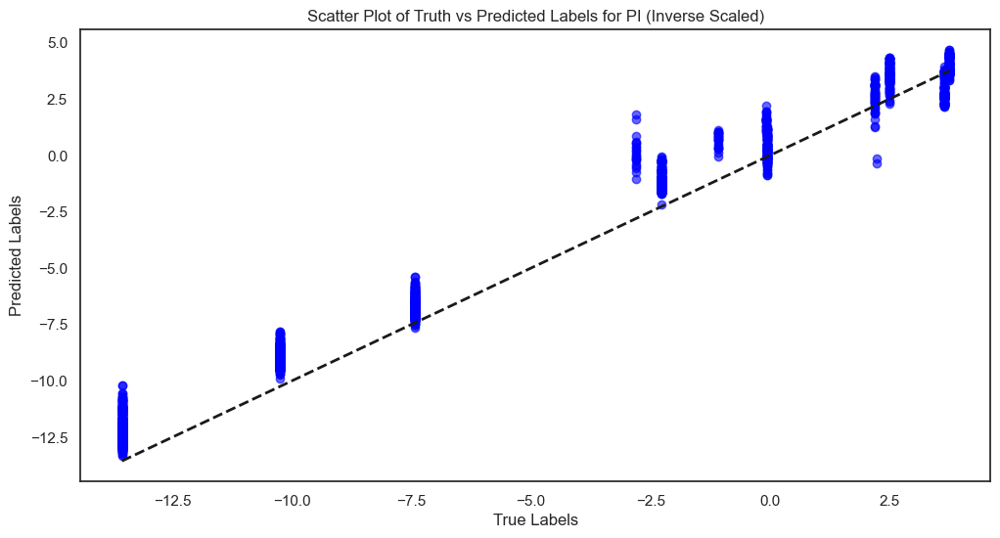

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Initialize performance metrics storage
train_r2, test_r2 = [], []
mae, mse, rmse, mape = [], [], [], []

# Initialize dataframes to store results
new_price_results = pd.DataFrame(columns=["Model", "Train R²", "Test R²", "MAE", "MSE", "RMSE", "MAPE"])
pi_results = pd.DataFrame(columns=["Model", "Train R²", "Test R²", "MAE", "MSE", "RMSE", "MAPE"])

# Scale input features and targets
scaler_x = MinMaxScaler()
scaler_y = MinMaxScaler()

X_train_scaled = scaler_x.fit_transform(X_train)
X_test_scaled = scaler_x.transform(X_test)

# Reshape input features for LSTM (samples, time_steps, features)
X_train_lstm = X_train_scaled.reshape((X_train_scaled.shape[0], X_train_scaled.shape[1], 1))
X_test_lstm = X_test_scaled.reshape((X_test_scaled.shape[0], X_test_scaled.shape[1], 1))

# Iterate over each target variable
for target_idx, target_name in enumerate(targets_120.columns):
    print(f"\n{'='*125}")
    print(f"Training Hybrid Model (BiLSTM+LSTM+GRU+TDL) for target variable: {target_name}")
    print(f"{'='*125}\n")

    # Scale the target variable
    y_train_scaled = scaler_y.fit_transform(y_train[[target_name]])
    y_test_scaled = scaler_y.transform(y_test[[target_name]])

    # Define the Hybrid model architecture
    model = models.Sequential([
        # Input Layer
        layers.InputLayer(input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])),

        # Bidirectional LSTM Layer
        layers.Bidirectional(layers.LSTM(128, activation='tanh', return_sequences=True)),
        layers.BatchNormalization(),
        layers.Dropout(0.3),

        # GRU Layer
        layers.GRU(64, activation='tanh', return_sequences=True),
        layers.BatchNormalization(),
        layers.Dropout(0.3),

        # LSTM Layer
        layers.LSTM(64, activation='tanh', return_sequences=True),
        layers.BatchNormalization(),
        layers.Dropout(0.3),

        # TimeDistributed Layer for sequence output refinement
        layers.TimeDistributed(layers.Dense(32, activation='relu')),
        layers.BatchNormalization(),
        layers.Dropout(0.3),

        # Flatten and Final Dense Output
        layers.Flatten(),
        layers.Dense(1, activation='linear')  # Regression Output
    ])

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=0.0005),
                  loss='mean_squared_error',
                  metrics=['mse'])

    # Define callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

    # Train the model
    history = model.fit(X_train_lstm, y_train_scaled,
                        validation_data=(X_test_lstm, y_test_scaled),
                        epochs=100, batch_size=1024,
                        callbacks=[early_stopping, lr_scheduler],
                        verbose=2)

    # Predict on training and test data
    y_train_pred = model.predict(X_train_lstm)
    y_test_pred = model.predict(X_test_lstm)

    # Inverse scale predictions and true values
    y_train_rescaled = scaler_y.inverse_transform(y_train_scaled)
    y_test_rescaled = scaler_y.inverse_transform(y_test_scaled)
    train_prediction_rescaled = scaler_y.inverse_transform(y_train_pred)
    test_prediction_rescaled = scaler_y.inverse_transform(y_test_pred)

    # Calculate metrics BEFORE inverse scaling
    train_r2_score = r2_score(y_train_scaled, y_train_pred)
    test_r2_score = r2_score(y_test_scaled, y_test_pred)
    mae_val = mean_absolute_error(y_test_scaled, y_test_pred)
    mse_val = mean_squared_error(y_test_scaled, y_test_pred)
    rmse_val = np.sqrt(mse_val)


    # Print metrics BEFORE inverse scaling
    print(f"Metrics BEFORE Inverse Scaling for Target: {target_name}")
    print(f"Train R²: {train_r2_score:.4f}")
    print(f"Test R²: {test_r2_score:.4f}")
    print(f"MAE: {mae_val:.4f}")
    print(f"MSE: {mse_val:.4f}")
    print(f"RMSE: {rmse_val:.4f}")
    print(f"MAPE: {mape_val:.2f}%")

    # Append metrics
    train_r2.append(train_r2_score)
    test_r2.append(test_r2_score)
    mae.append(mae_val)
    mse.append(mse_val)
    rmse.append(rmse_val)
    mape.append(mape_val)


    # Line plot of truth vs predicted labels
    plt.figure(figsize=(30, 6))
    plt.plot(range(len(y_test_rescaled)), y_test_rescaled, label='True Labels', color='black', linewidth=2)
    plt.plot(range(len(test_prediction_rescaled)), test_prediction_rescaled, label='Predicted Labels', color='orange', linestyle='--')
    plt.title(f'Truth vs Predicted Labels for {target_name} (Inverse Scaled)', fontsize=20)
    plt.xlabel('Index', fontsize=16)
    plt.ylabel('Target Value', fontsize=16)
    plt.legend()
    plt.show()

    # Scatter plot of truth vs predicted labels
    plt.figure(figsize=(12, 6))
    plt.scatter(y_test_rescaled, test_prediction_rescaled, alpha=0.6, color='blue')
    plt.plot([y_test_rescaled.min(), y_test_rescaled.max()], [y_test_rescaled.min(), y_test_rescaled.max()], 'k--', lw=2)
    plt.title(f'Scatter Plot of Truth vs Predicted Labels for {target_name} (Inverse Scaled)')
    plt.xlabel('True Labels')
    plt.ylabel('Predicted Labels')
    plt.show()

    # Store results in respective DataFrames
    result_row = {"Model": "Hybrid (BiLSTM+LSTM+GRU+TDL)",
                  "Train R²": train_r2_score,
                  "Test R²": test_r2_score,
                  "MAE": mae_val,
                  "MSE": mse_val,
                  "RMSE": rmse_val,
                  "MAPE": mape_val}

    if target_name == 'new_price':
        new_price_results = pd.concat([new_price_results, pd.DataFrame([result_row])], ignore_index=True)
    else:
        pi_results = pd.concat([pi_results, pd.DataFrame([result_row])], ignore_index=True)


In [ ]:
# Display results tables
print("\nResults for 'new_price' Target:")
display(new_price_results)


Results for 'new_price' Target:


,Model,Train R²,Test R²,MAE,MSE,RMSE,MAPE
0,Hybrid (BiLSTM+LSTM+GRU+TDL),0.001408,-0.000265,0.137146,0.031962,0.178778,45.794179


In [ ]:
print("\nResults for 'PI' Target:")
display(pi_results)


Results for 'PI' Target:


,Model,Train R²,Test R²,MAE,MSE,RMSE,MAPE
0,Hybrid (BiLSTM+LSTM+GRU+TDL),0.95936,0.961573,0.061967,0.005079,0.071267,15.345488


## Hyper Paramter Tuning

In [ ]:
# 1. Split data into train-test (initial split for feature selection)
X_train, X_test, y_train, y_test = train_test_split(features, targets_120, test_size=0.3, random_state=42)

# Print shapes before feature selection
print("Before Feature Selection:")
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")

# 2. Apply Tree-Based Feature Selection (ExtraTreesRegressor)
# Use Extra Trees to compute feature importance
tree_model = ExtraTreesRegressor(n_estimators=100, random_state=42)
tree_model.fit(X_train, y_train['new_price'])

# Get feature importances
feature_importances = tree_model.feature_importances_

# Create a DataFrame to visualize feature importance
importance_df = pd.DataFrame({
    'Feature': features.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

print("\nFeature Importance:")
display(importance_df)

Before Feature Selection:
X_train shape: (76876, 55)
X_test shape: (32948, 55)
y_train shape: (76876, 2)
y_test shape: (32948, 2)

Feature Importance:


,Feature,Importance
0,saleable_area(ft^2),0.378856
40,property_size_Small,0.207496
1,floor,0.184293
34,region_HK,0.019316
37,region_NTWest,0.017379
12,SD,0.011513
35,region_KLN,0.009970
7,IR,0.007918
33,district_Yuen Long District,0.007690
38,property_size_Large,0.007647


In [ ]:
# 3. Select Top Features Based on Threshold (e.g., Top 10 Features)
top_n_features = 45  # Change this to select more or fewer features
selected_features = importance_df.head(top_n_features)['Feature'].tolist()

print(f"\nTop {top_n_features} Selected Features: {selected_features}")

# 4. Subset the Data with Selected Features
X_train = X_train[selected_features]
X_test = X_test[selected_features]

# Print shapes after feature selection
print("\nAfter Feature Selection:")
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")


Top 45 Selected Features: ['saleable_area(ft^2)', 'property_size_Small', 'floor', 'region_HK', 'region_NTWest', 'SD', 'region_KLN', 'IR', 'district_Yuen Long District', 'property_size_Large', 'district_New Territories East Long Ping Estate', 'district_HKIsIand Eastern District', 'MW', 'property_size_Medium', 'district_HKIsIand Southern District', 'UR', 'district_Central and Western District', 'district_Tuen Mun District', 'CG', 'CI', 'M3', 'SM', 'YearQuarter_2022Q2', 'GDP', 'district_New Territories East Sha Tin District', 'district_Kowloon Yau Tsim Mong District', 'district_Wan Chai District', 'region_NTEast', 'YearQuarter_2021Q4', 'district_Kowloon Kowloon City District', 'property_size_Very Large', 'YearQuarter_2022Q3', 'district_Kwai Tsing District', 'HS', 'YearQuarter_2021Q3', 'district_Tsuen Wan District', 'YearQuarter_2022Q4', 'YearQuarter_2021Q2', 'YearQuarter_2022Q1', 'CPI', 'district_Kowloon Kwun Tong District', 'district_New Territories West Islands District', 'PG', 'distri

In [ ]:
X_train = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

In [ ]:
!pip uninstall keras-tuner

In [ ]:
import keras_tuner

print(keras_tuner.__version__)

1.1.0


In [ ]:
from keras_tuner import HyperModel, RandomSearch, Hyperband, BayesianOptimization
from tensorflow.keras import regularizers


# Scale the target variable
y_train = scaler_y.fit_transform(y_train[['new_price']])
y_test = scaler_y.transform(y_test[['new_price']])


# Initialize Results Table
results_table = pd.DataFrame(columns=[
    "Units Layer 1", "Activation", "Dropout Rate", "Batch Norm",
    "Learning Rate", "Optimizer", "L2 Regularization", "Train R²",
    "Test R²", "MAE", "MSE", "RMSE", "MAPE"
])

ModuleNotFoundError: No module named 'keras_tuner'

In [ ]:
# Build Model Function
def build_model(hp):
    model = tf.keras.Sequential()

    # LSTM Layer
    model.add(layers.LSTM(
        units=hp.Int('units_layer_1', min_value=32, max_value=256, step=32),
        activation=hp.Choice('activation', values=['relu', 'tanh', 'sigmoid', 'LeakyReLU', 'ELU']),
        input_shape=(X_train.shape[1], X_train.shape[2]),
        kernel_regularizer=regularizers.l2(hp.Float('l2', min_value=1e-5, max_value=1e-2, sampling='LOG'))
    ))

    # Batch Normalization (Optional)
    if hp.Boolean('batch_norm'):
        model.add(layers.BatchNormalization())

    # Dropout Layer
    model.add(layers.Dropout(hp.Float('dropout_rate', min_value=0.1, max_value=0.5, step=0.1)))

    # Dense Output Layer
    model.add(layers.Dense(1, activation='linear'))

    # Compile Model
    model.compile(
        optimizer=hp.Choice('optimizer', values=['adam', 'rmsprop', 'sgd']),
        loss='mean_squared_error',
        metrics=['mae']
    )
    return model

# Initialize Keras Tuner
tuner = RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=50,  # Number of experiments
    executions_per_trial=1,
    directory='tuner_results',
    project_name='lstm_tuning'
)

# Define Early Stopping Callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Run Tuner Search
tuner.search(X_train, y_train, validation_data=(X_test, y_test),
             epochs=50, batch_size=32, callbacks=[early_stopping])

# Evaluate Trials and Store Results
for trial in tuner.oracle.get_best_trials(num_trials=100):
    hp = trial.hyperparameters

    # Rebuild the best model for the current trial
    model = tuner.hypermodel.build(hp)
    model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Inverse Transform Predictions and Actual Values
    y_train_actual = scaler_y.inverse_transform(y_train)
    y_test_actual = scaler_y.inverse_transform(y_test)
    y_train_pred_actual = scaler_y.inverse_transform(y_train_pred)
    y_test_pred_actual = scaler_y.inverse_transform(y_test_pred)

    # Calculate Metrics
    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    mae = mean_absolute_error(y_test, y_test_pred)
    mse = mean_squared_error(y_test, y_test_pred)
    rmse = np.sqrt(mse)

    # Ensure arrays are 1D for MAPE calculation
    y_test_target_flat = y_test.flatten()
    test_prediction_flat = y_test_pred.flatten()

    # Avoid division by zero
    denominator = np.where(y_test_target_flat == 0, 1, y_test_target_flat)

    # Compute MAPE
    mape_val = np.mean(np.abs((y_test_target_flat - test_prediction_flat) / denominator)) * 100


    # Append Results to DataFrame
    results_table = results_table.append({
        "Units Layer 1": hp.get('units_layer_1'),
        "Activation": hp.get('activation'),
        "Dropout Rate": hp.get('dropout_rate'),
        "Batch Norm": hp.get('batch_norm'),
        "Optimizer": hp.get('optimizer'),
        "L2 Regularization": hp.get('l2'),
        "Train R²": train_r2,
        "Test R²": test_r2,
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "MAPE": mape
    }, ignore_index=True)

Trial 51 Complete [00h 45m 38s]
val_loss: 0.01963314414024353

Best val_loss So Far: 0.016532672569155693
Total elapsed time: 07h 09m 45s
INFO:tensorflow:Oracle triggered exit


In [ ]:
# Append Results to DataFrame
results_table = results_table.append({
    "Units Layer 1": hp.get('units_layer_1'),
    "Activation": hp.get('activation'),
    "Dropout Rate": hp.get('dropout_rate'),
    "Batch Norm": hp.get('batch_norm'),
    "Optimizer": hp.get('optimizer'),
    "L2 Regularization": hp.get('l2'),
    "Train R²": train_r2,
    "Test R²": test_r2,
    "MAE": mae,
    "MSE": mse,
    "RMSE": rmse,
    "MAPE": mape
}, ignore_index=True)

In [ ]:
# Save Results to CSV
results_table.to_csv('lstm_tuning_results.csv', index=False)
print("Results saved successfully!")

# Display Results
print(results_table)

## More Evaluation of Modelling Phase.

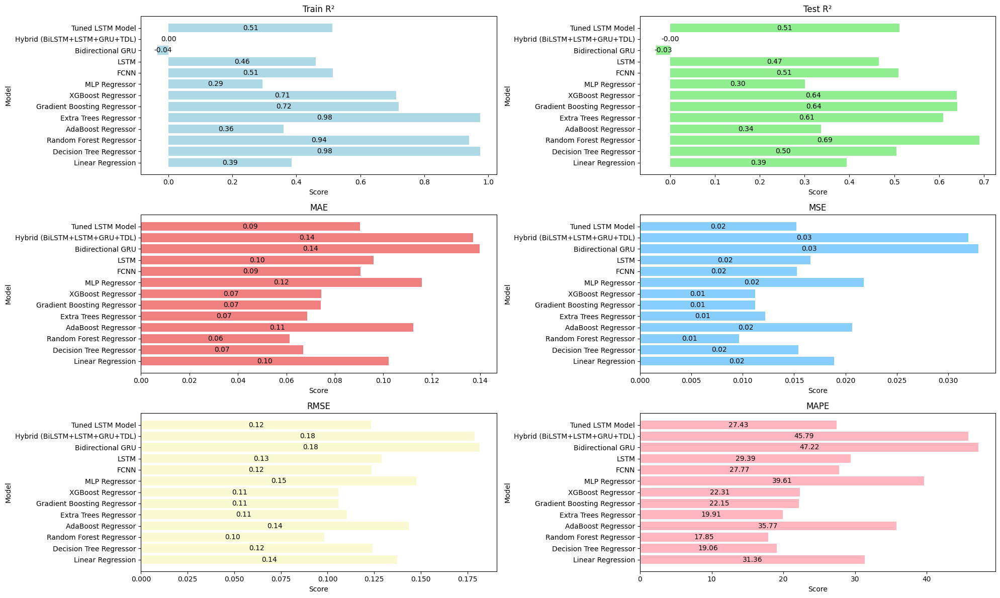

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data for the models
models = [
    "Linear Regression", "Decision Tree Regressor", "Random Forest Regressor", "AdaBoost Regressor",
    "Extra Trees Regressor", "Gradient Boosting Regressor", "XGBoost Regressor", "MLP Regressor",
    "FCNN", "LSTM", "Bidirectional GRU", "Hybrid (BiLSTM+LSTM+GRU+TDL)", "Tuned LSTM Model"
]

train_r2 = [
    0.385859, 0.975035, 0.940059, 0.359618, 0.975035, 0.720012, 0.711880, 0.293589,
    0.514590, 0.460800, -0.035270, 0.001408, 0.512800
]

test_r2 = [
    0.393754, 0.504650, 0.689883, 0.336881, 0.609072, 0.640139, 0.639576, 0.300880,
    0.509037, 0.465600, -0.031162, -0.000265, 0.511400
]

mae = [
    0.102222, 0.066951, 0.061365, 0.112367, 0.068588, 0.074219, 0.074433, 0.115979,
    0.090590, 0.096100, 0.139759, 0.137146, 0.090300
]

mse = [
    0.018876, 0.015423, 0.009656, 0.020647, 0.012172, 0.011205, 0.011222, 0.021768,
    0.015287, 0.016600, 0.032949, 0.031962, 0.015200
]

rmse = [
    0.137390, 0.124190, 0.098264, 0.143690, 0.110326, 0.105852, 0.105935, 0.147539,
    0.123639, 0.129000, 0.181518, 0.178778, 0.123300
]

mape = [
    31.359832, 19.058001, 17.853252, 35.765465, 19.907083, 22.147861, 22.308731, 39.609249,
    27.771738, 29.390000, 47.217730, 45.794179, 27.430000
]

# Define figure size and layout
fig, axes = plt.subplots(3, 2, figsize=(20, 12))

# Create bar plots for each metric
metrics = [train_r2, test_r2, mae, mse, rmse, mape]
metric_titles = ["Train R²", "Test R²", "MAE", "MSE", "RMSE", "MAPE"]
colors = ['lightblue', 'lightgreen', 'lightcoral', 'lightskyblue', 'lightgoldenrodyellow', 'lightpink']

for ax, metric, title, color in zip(axes.flatten(), metrics, metric_titles, colors):
    bars = ax.barh(models, metric, color=color)
    ax.set_title(title, fontsize=12)
    ax.set_xlabel('Score', fontsize=10)
    ax.set_ylabel('Model', fontsize=10)

    # Annotate with values in the center of each bar
    for i, bar in enumerate(bars):
        width = bar.get_width()
        ax.text(width / 2, bar.get_y() + bar.get_height() / 2, f'{width:.2f}', ha='center', va='center', fontsize=10)

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()


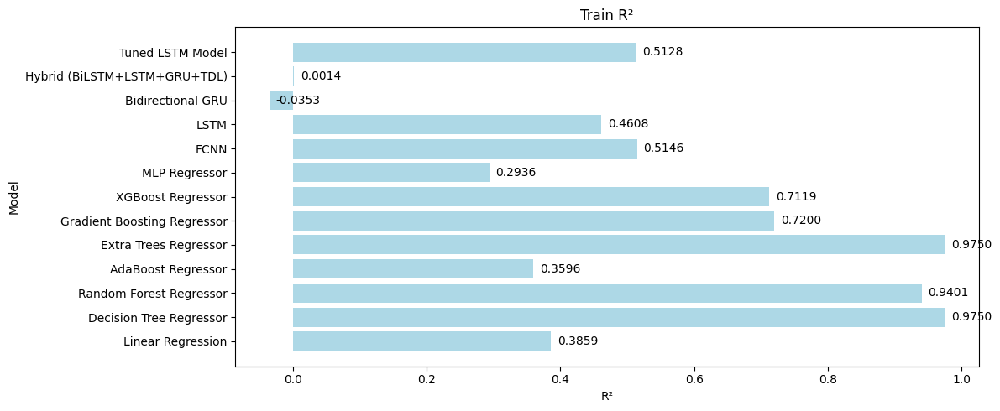

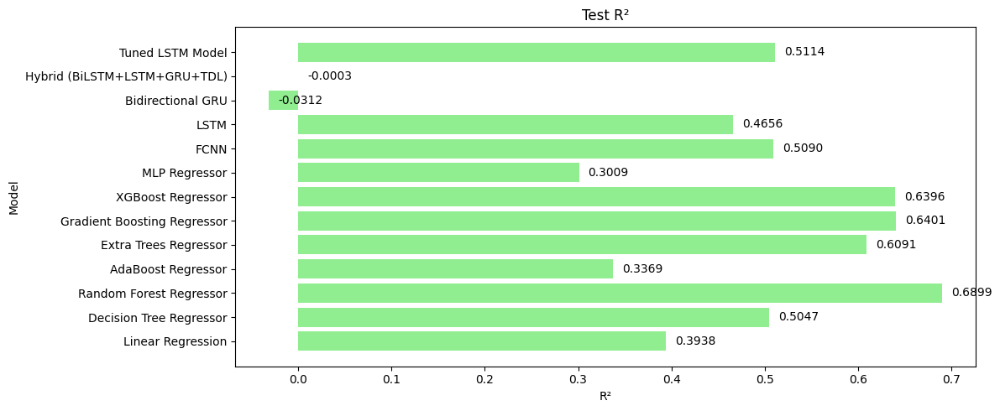

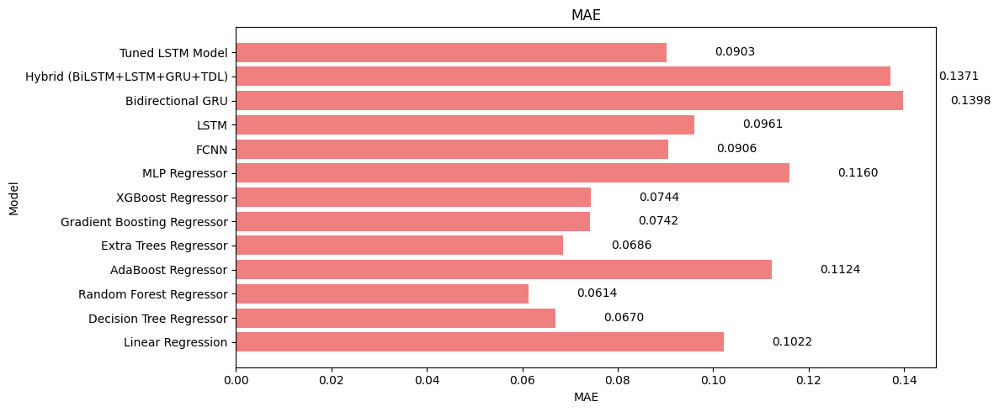

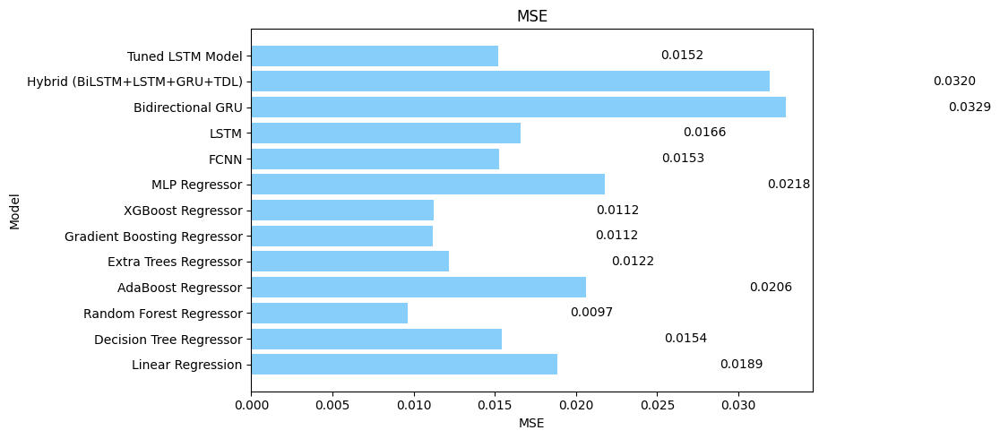

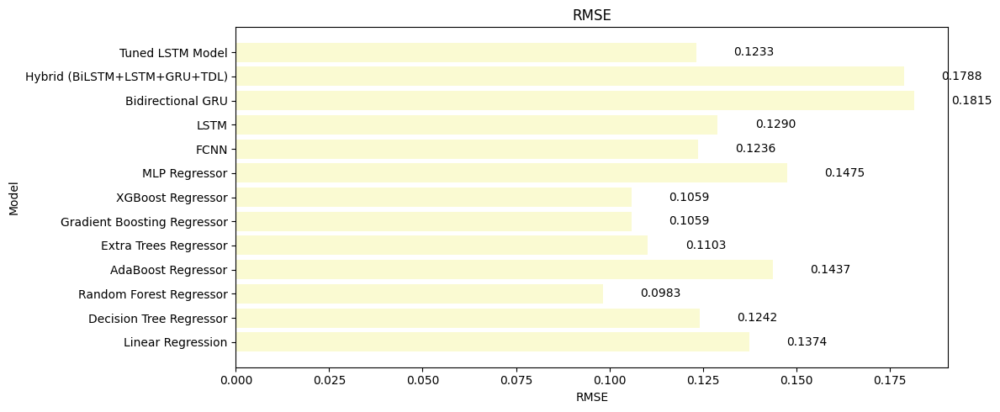

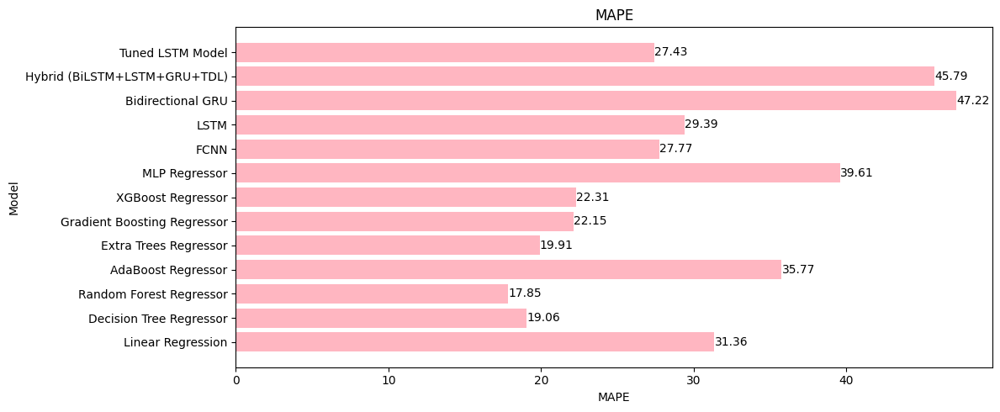

In [ ]:
# Create each graph individually

# Train R² graph
fig, ax = plt.subplots(figsize=(12, 5))
ax.barh(models, train_r2, color='lightblue')
ax.set_title("Train R²", fontsize=12)
ax.set_xlabel('R²', fontsize=10)
ax.set_ylabel('Model', fontsize=10)
for i, v in enumerate(train_r2):
    ax.text(v + 0.01, i, f'{v:.4f}', va='center', fontsize=10)
plt.tight_layout()
plt.show()

# Test R² graph
fig, ax = plt.subplots(figsize=(12, 5))
ax.barh(models, test_r2, color='lightgreen')
ax.set_title("Test R²", fontsize=12)
ax.set_xlabel('R²', fontsize=10)
ax.set_ylabel('Model', fontsize=10)
for i, v in enumerate(test_r2):
    ax.text(v + 0.01, i, f'{v:.4f}', va='center', fontsize=10)
plt.tight_layout()
plt.show()

# MAE graph
fig, ax = plt.subplots(figsize=(12, 5))
ax.barh(models, mae, color='lightcoral')
ax.set_title("MAE", fontsize=12)
ax.set_xlabel('MAE', fontsize=10)
ax.set_ylabel('Model', fontsize=10)
for i, v in enumerate(mae):
    ax.text(v + 0.01, i, f'{v:.4f}', va='center', fontsize=10)
plt.tight_layout()
plt.show()

# MSE graph
fig, ax = plt.subplots(figsize=(12, 5))
ax.barh(models, mse, color='lightskyblue')
ax.set_title("MSE", fontsize=12)
ax.set_xlabel('MSE', fontsize=10)
ax.set_ylabel('Model', fontsize=10)
for i, v in enumerate(mse):
    ax.text(v + 0.01, i, f'{v:.4f}', va='center', fontsize=10)
plt.tight_layout()
plt.show()

# RMSE graph
fig, ax = plt.subplots(figsize=(12, 5))
ax.barh(models, rmse, color='lightgoldenrodyellow')
ax.set_title("RMSE", fontsize=12)
ax.set_xlabel('RMSE', fontsize=10)
ax.set_ylabel('Model', fontsize=10)
for i, v in enumerate(rmse):
    ax.text(v + 0.01, i, f'{v:.4f}', va='center', fontsize=10)
plt.tight_layout()
plt.show()

# MAPE graph
fig, ax = plt.subplots(figsize=(12, 5))
ax.barh(models, mape, color='lightpink')
ax.set_title("MAPE", fontsize=12)
ax.set_xlabel('MAPE', fontsize=10)
ax.set_ylabel('Model', fontsize=10)
for i, v in enumerate(mape):
    ax.text(v + 0.01, i, f'{v:.2f}', va='center', fontsize=10)
plt.tight_layout()
plt.show()
